In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_channels
from autoencoder import network
from autoencoder import utils

/home/cjw/anaconda3/envs/deep/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmCompensatedTifs"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Ice.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_CCB.mm', '/media/cjw/Data/cyto/mmComp

dict_keys(['Fish3_CCB.mm', 'Fish4_ICE.mm', 'Fish3_Untreated.mm', 'Fish6_Untreated.mm', 'Fish2_Untreated.mm', 'Fish1_Ice.mm', 'Fish5_Untreated.mm', 'Fish6_ICE.mm', 'Fish4_CCB.mm', 'Fish6_CCB.mm', 'Fish2_CCB.mm', 'Fish1_Untreated.mm', 'Fish4_Untreated.mm', 'Fish2_ICE.mm', 'Fish5_CCB.mm', 'Fish3_ICE.mm', 'Fish1_CCB.mm', 'Fish5_ICE.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


Encoder True
Tensor("ExpandDims:0", shape=(?, 32, 32, 1), dtype=float32) (?, 32, 32, 1)
isize:  4 32
dh0 (?, 32, 32, 1)
Encoder True
Tensor("ExpandDims_1:0", shape=(?, 32, 32, 1), dtype=float32) (?, 32, 32, 1)
isize:  4 32
dh0 (?, 32, 32, 1)
Encoder True
Tensor("ExpandDims_2:0", shape=(?, 32, 32, 1), dtype=float32) (?, 32, 32, 1)
isize:  4 32
dh0 (?, 32, 32, 1)
Encoder True
Tensor("ExpandDims_3:0", shape=(?, 32, 32, 1), dtype=float32) (?, 32, 32, 1)
isize:  4 32
dh0 (?, 32, 32, 1)
Split [<tf.Tensor 'split:0' shape=(1, ?, 64) dtype=float32>, <tf.Tensor 'split:1' shape=(1, ?, 64) dtype=float32>, <tf.Tensor 'split:2' shape=(1, ?, 64) dtype=float32>, <tf.Tensor 'split:3' shape=(1, ?, 64) dtype=float32>]
Concat [None, 256]
Stack Tensor("stack:0", shape=(4, ?, 64), dtype=float32)
Comb loss Tensor("ExpandDims_7:0", shape=(?, 32, 32, 1), dtype=float32) Tensor("strided_slice_11:0", shape=(?, 32, 32, 1), dtype=float32) Tensor("packed:0", shape=(4,), dtype=float32) [<tf.Tensor 'Sum:0' shape=() dt

/home/cjw/anaconda3/envs/deep/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


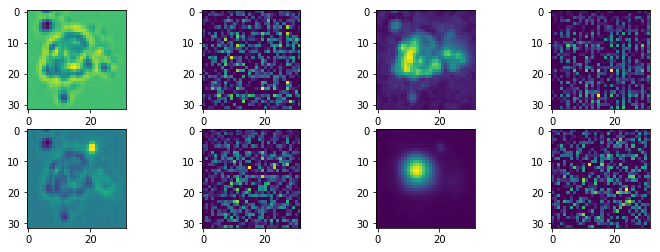

(4, 128, 64)
Epoch:  0 Iteration:  200 Loss:  1735.0084
(32, 32, 4) (4, 32, 32, 1)


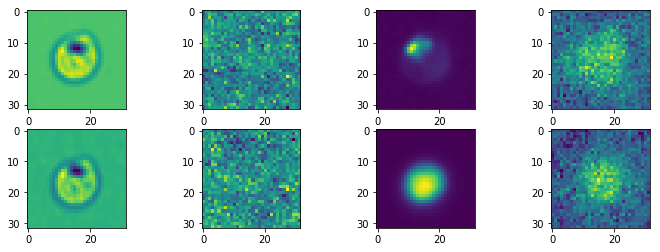

(4, 128, 64)
Epoch:  0 Iteration:  400 Loss:  1649.2449
(32, 32, 4) (4, 32, 32, 1)


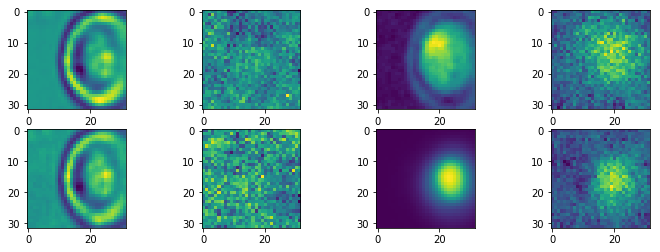

(4, 128, 64)
Epoch:  0 Iteration:  600 Loss:  2008.0337
(32, 32, 4) (4, 32, 32, 1)


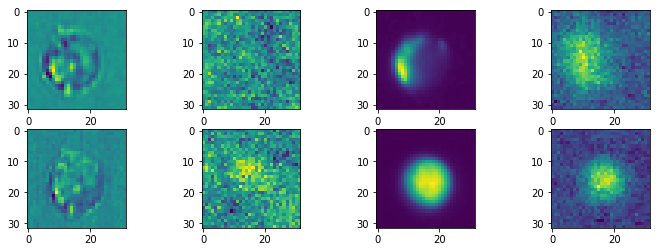

(4, 128, 64)
Epoch:  0 Iteration:  800 Loss:  1395.4197
(32, 32, 4) (4, 32, 32, 1)


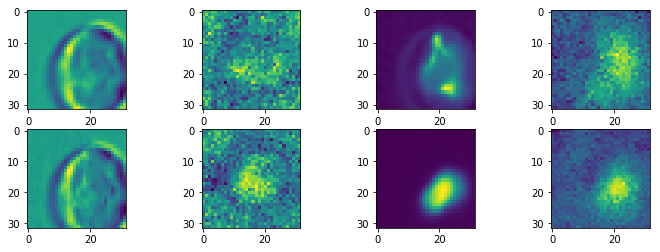

(4, 128, 64)
Epoch:  0 Iteration:  1000 Loss:  1238.5044
(32, 32, 4) (4, 32, 32, 1)


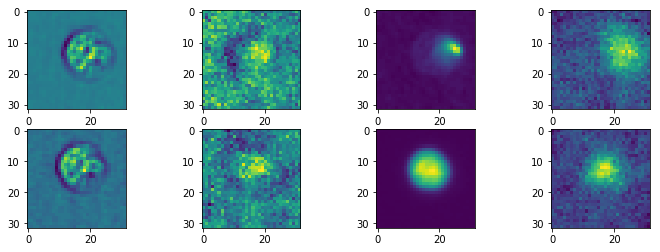

(4, 128, 64)
Epoch:  0 Iteration:  1200 Loss:  1029.2319
(32, 32, 4) (4, 32, 32, 1)


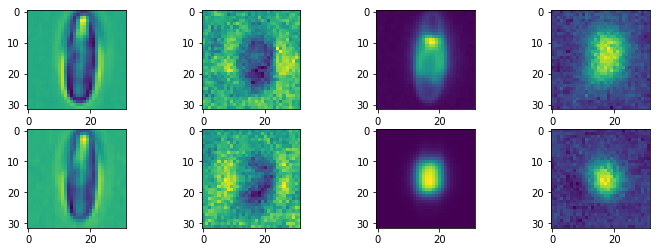

(4, 128, 64)
Epoch:  0 Iteration:  1400 Loss:  1006.18036
(32, 32, 4) (4, 32, 32, 1)


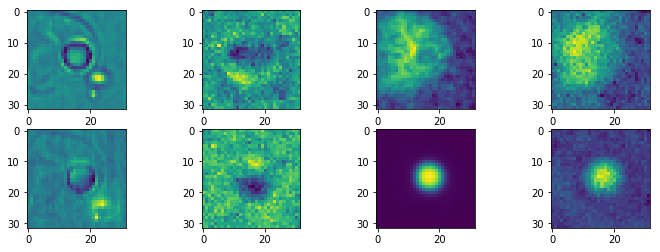

(4, 128, 64)
Epoch:  1 Iteration:  0 Loss:  969.41125
(32, 32, 4) (4, 32, 32, 1)


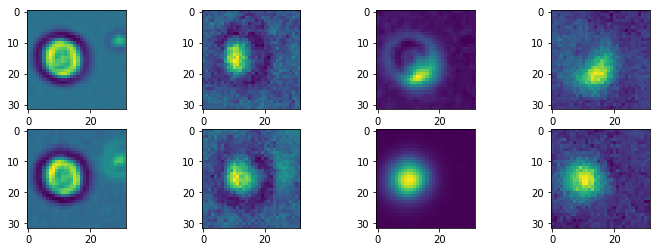

(4, 128, 64)
Epoch:  1 Iteration:  200 Loss:  918.4042
(32, 32, 4) (4, 32, 32, 1)


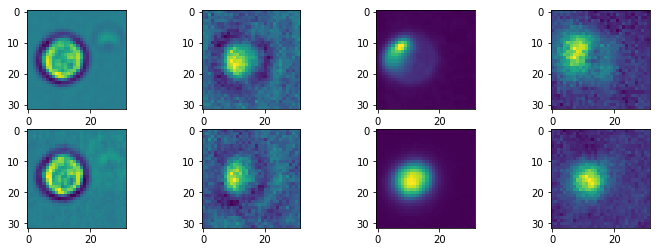

(4, 128, 64)
Epoch:  1 Iteration:  400 Loss:  757.3578
(32, 32, 4) (4, 32, 32, 1)


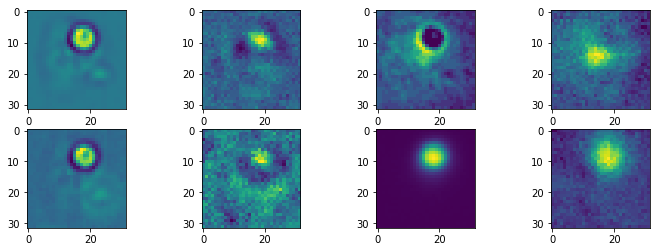

(4, 128, 64)
Epoch:  1 Iteration:  600 Loss:  723.16925
(32, 32, 4) (4, 32, 32, 1)


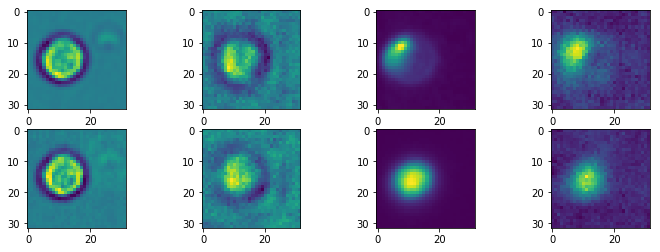

(4, 128, 64)
Epoch:  1 Iteration:  800 Loss:  749.3893
(32, 32, 4) (4, 32, 32, 1)


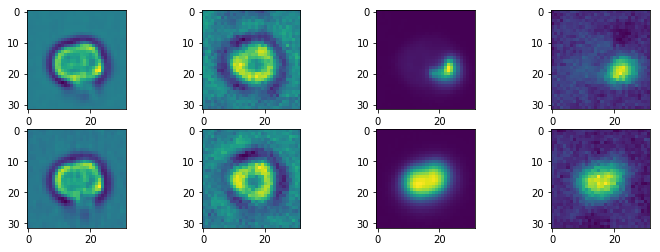

(4, 128, 64)
Epoch:  1 Iteration:  1000 Loss:  698.0569
(32, 32, 4) (4, 32, 32, 1)


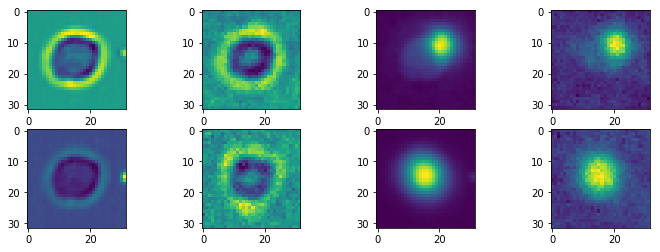

(4, 128, 64)
Epoch:  1 Iteration:  1200 Loss:  622.21985
(32, 32, 4) (4, 32, 32, 1)


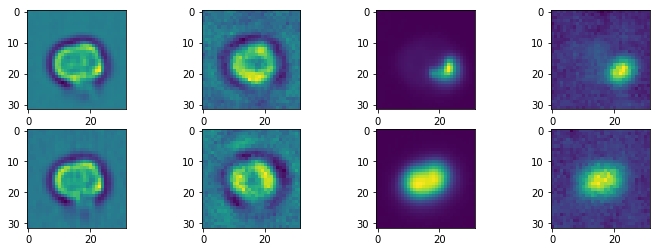

(4, 128, 64)
Epoch:  1 Iteration:  1400 Loss:  618.22156
(32, 32, 4) (4, 32, 32, 1)


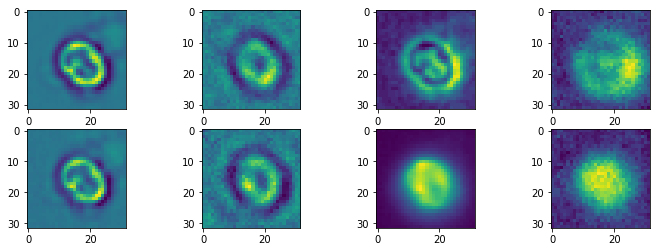

(4, 128, 64)
Epoch:  2 Iteration:  0 Loss:  640.437
(32, 32, 4) (4, 32, 32, 1)


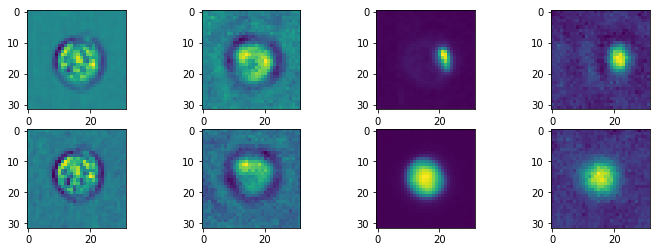

(4, 128, 64)
Epoch:  2 Iteration:  200 Loss:  537.5594
(32, 32, 4) (4, 32, 32, 1)


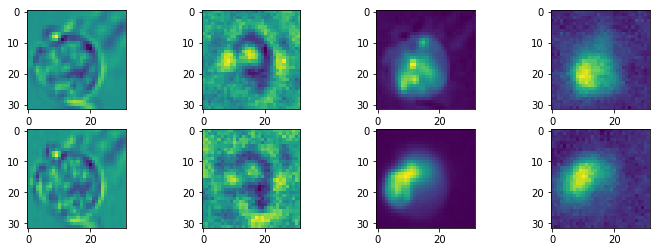

(4, 128, 64)
Epoch:  2 Iteration:  400 Loss:  512.2915
(32, 32, 4) (4, 32, 32, 1)


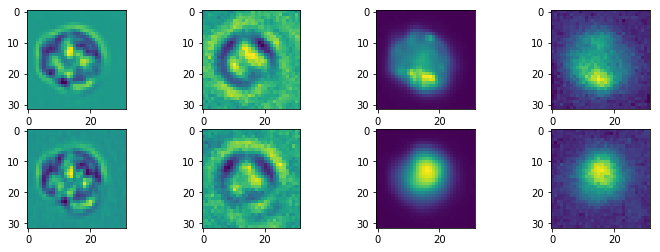

(4, 128, 64)
Epoch:  2 Iteration:  600 Loss:  515.9468
(32, 32, 4) (4, 32, 32, 1)


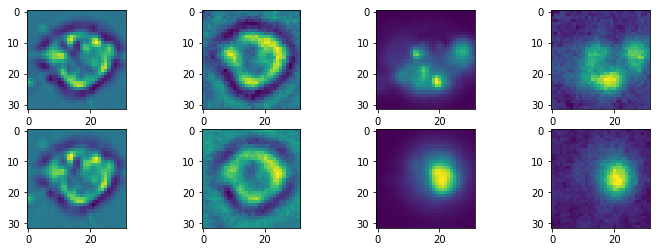

(4, 128, 64)
Epoch:  2 Iteration:  800 Loss:  529.14545
(32, 32, 4) (4, 32, 32, 1)


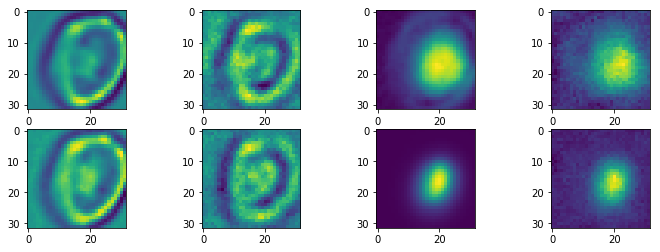

(4, 128, 64)
Epoch:  2 Iteration:  1000 Loss:  485.71695
(32, 32, 4) (4, 32, 32, 1)


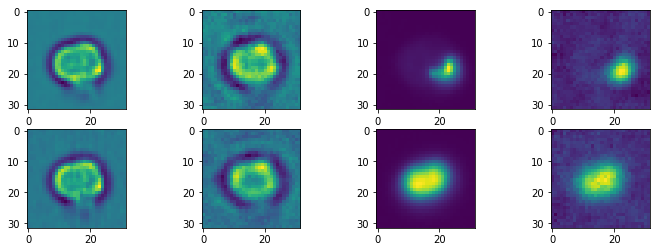

(4, 128, 64)
Epoch:  2 Iteration:  1200 Loss:  488.33112
(32, 32, 4) (4, 32, 32, 1)


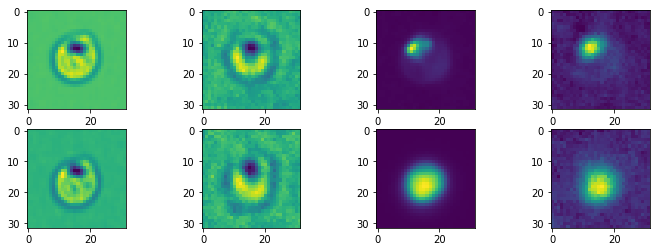

(4, 128, 64)
Epoch:  2 Iteration:  1400 Loss:  471.9146
(32, 32, 4) (4, 32, 32, 1)


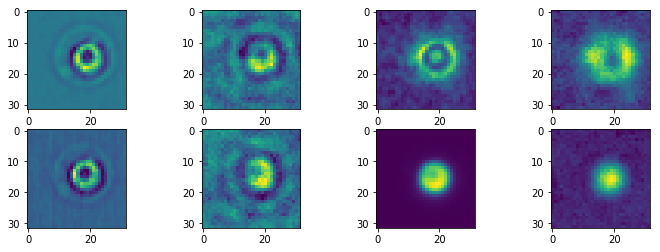

(4, 128, 64)
Epoch:  3 Iteration:  0 Loss:  484.0837
(32, 32, 4) (4, 32, 32, 1)


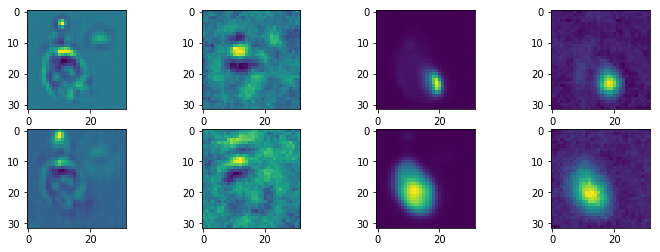

(4, 128, 64)
Epoch:  3 Iteration:  200 Loss:  413.56458
(32, 32, 4) (4, 32, 32, 1)


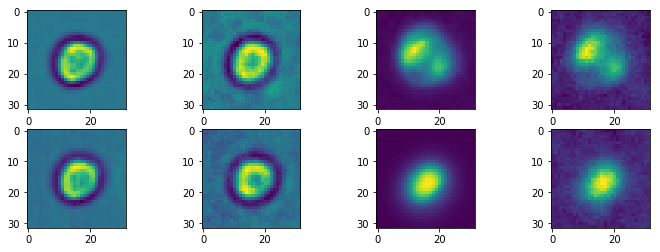

(4, 128, 64)
Epoch:  3 Iteration:  400 Loss:  389.50296
(32, 32, 4) (4, 32, 32, 1)


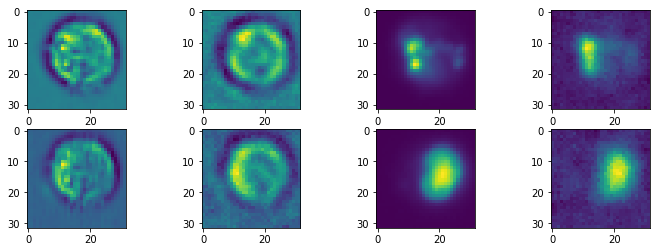

(4, 128, 64)
Epoch:  3 Iteration:  600 Loss:  408.52078
(32, 32, 4) (4, 32, 32, 1)


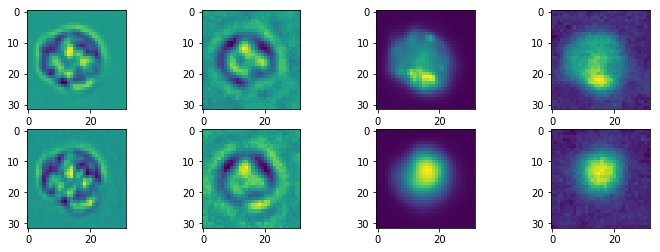

(4, 128, 64)
Epoch:  3 Iteration:  800 Loss:  424.66827
(32, 32, 4) (4, 32, 32, 1)


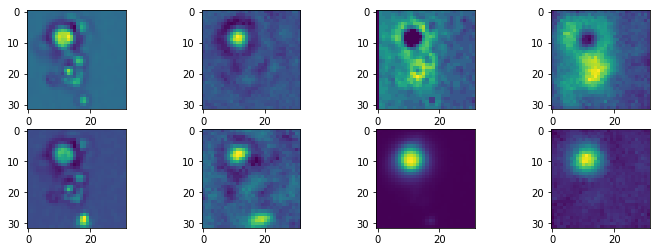

(4, 128, 64)
Epoch:  3 Iteration:  1000 Loss:  388.42798
(32, 32, 4) (4, 32, 32, 1)


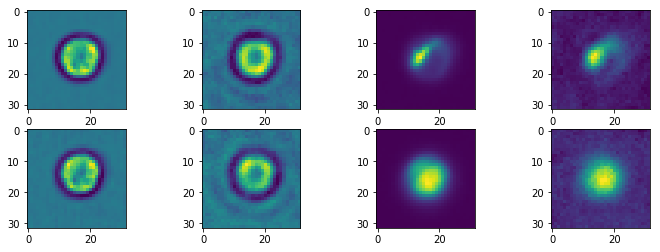

(4, 128, 64)
Epoch:  3 Iteration:  1200 Loss:  383.00323
(32, 32, 4) (4, 32, 32, 1)


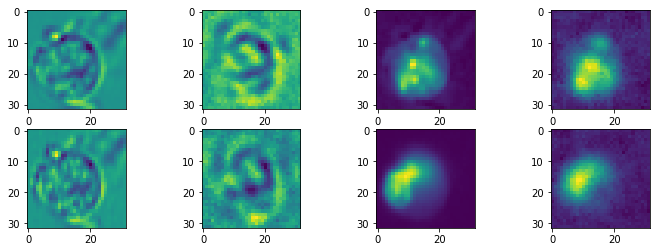

(4, 128, 64)
Epoch:  3 Iteration:  1400 Loss:  388.21323
(32, 32, 4) (4, 32, 32, 1)


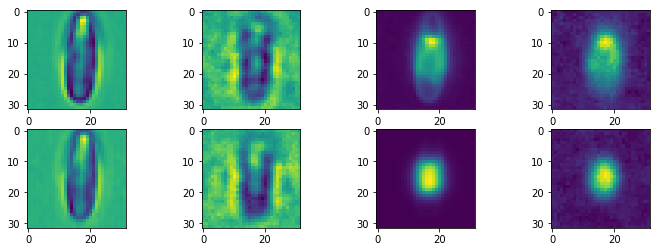

(4, 128, 64)
Epoch:  4 Iteration:  0 Loss:  382.07367
(32, 32, 4) (4, 32, 32, 1)


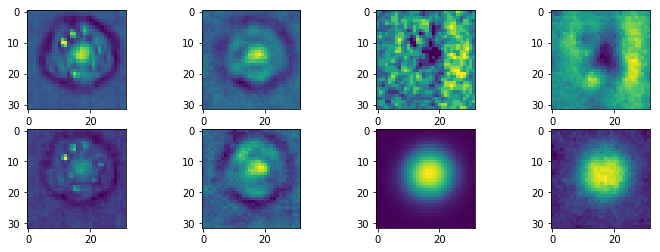

(4, 128, 64)
Epoch:  4 Iteration:  200 Loss:  340.20447
(32, 32, 4) (4, 32, 32, 1)


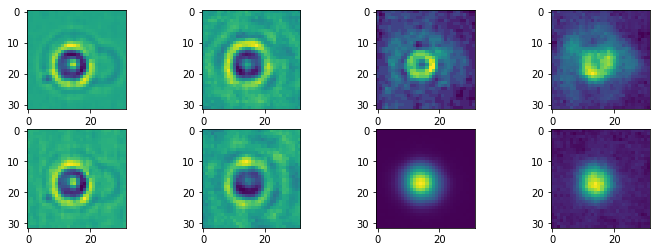

(4, 128, 64)
Epoch:  4 Iteration:  400 Loss:  334.74042
(32, 32, 4) (4, 32, 32, 1)


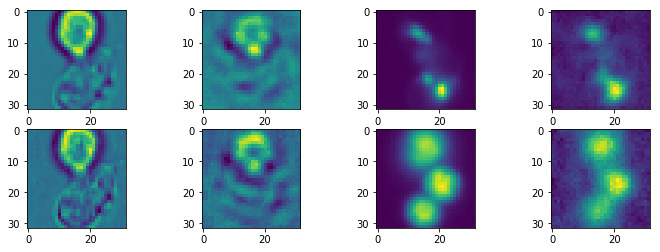

(4, 128, 64)
Epoch:  4 Iteration:  600 Loss:  364.0432
(32, 32, 4) (4, 32, 32, 1)


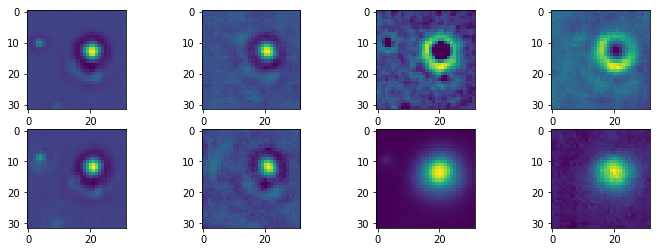

(4, 128, 64)
Epoch:  4 Iteration:  800 Loss:  361.88245
(32, 32, 4) (4, 32, 32, 1)


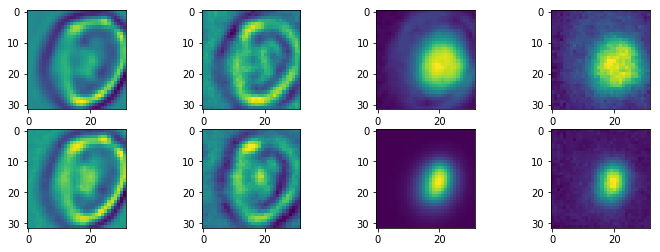

(4, 128, 64)
Epoch:  4 Iteration:  1000 Loss:  334.43555
(32, 32, 4) (4, 32, 32, 1)


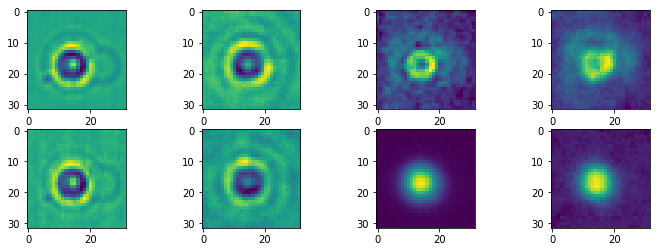

(4, 128, 64)
Epoch:  4 Iteration:  1200 Loss:  342.46884
(32, 32, 4) (4, 32, 32, 1)


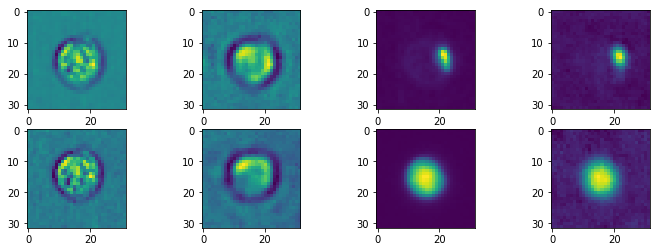

(4, 128, 64)
Epoch:  4 Iteration:  1400 Loss:  344.61816
(32, 32, 4) (4, 32, 32, 1)


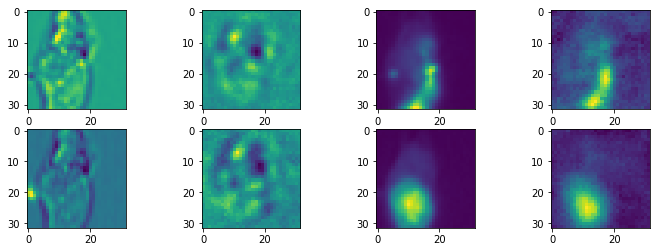

(4, 128, 64)
Epoch:  5 Iteration:  0 Loss:  330.07144
(32, 32, 4) (4, 32, 32, 1)


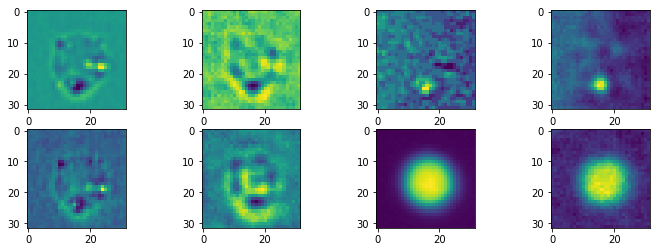

(4, 128, 64)
Epoch:  5 Iteration:  200 Loss:  306.2442
(32, 32, 4) (4, 32, 32, 1)


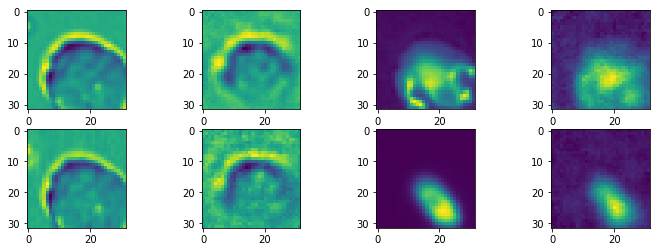

(4, 128, 64)
Epoch:  5 Iteration:  400 Loss:  291.3084
(32, 32, 4) (4, 32, 32, 1)


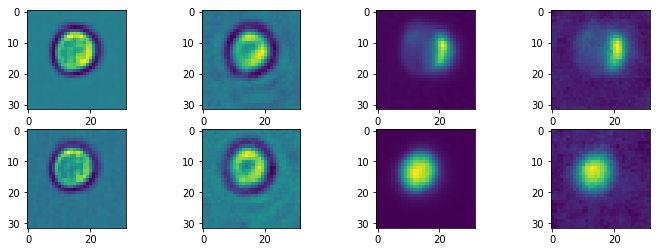

(4, 128, 64)
Epoch:  5 Iteration:  600 Loss:  305.84528
(32, 32, 4) (4, 32, 32, 1)


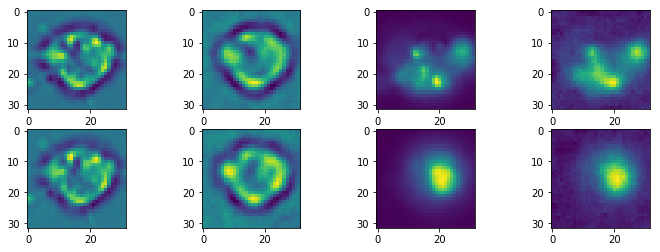

(4, 128, 64)
Epoch:  5 Iteration:  800 Loss:  327.17987
(32, 32, 4) (4, 32, 32, 1)


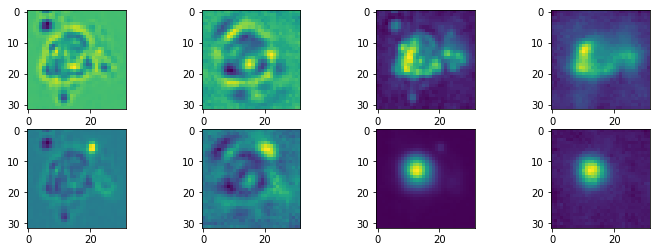

(4, 128, 64)
Epoch:  5 Iteration:  1000 Loss:  305.45734
(32, 32, 4) (4, 32, 32, 1)


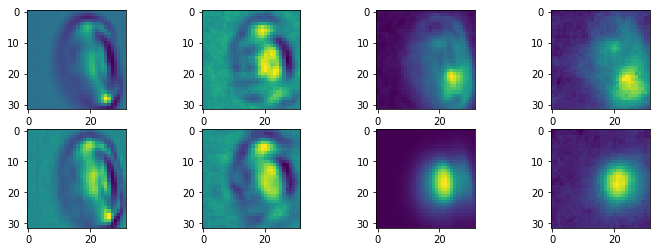

(4, 128, 64)
Epoch:  5 Iteration:  1200 Loss:  302.2622
(32, 32, 4) (4, 32, 32, 1)


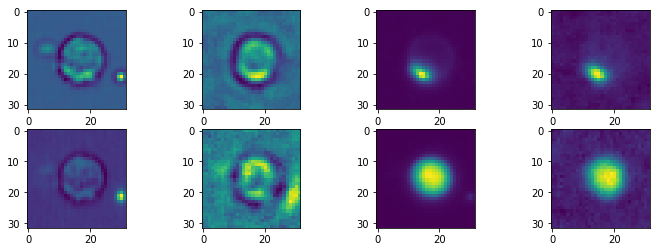

(4, 128, 64)
Epoch:  5 Iteration:  1400 Loss:  304.37064
(32, 32, 4) (4, 32, 32, 1)


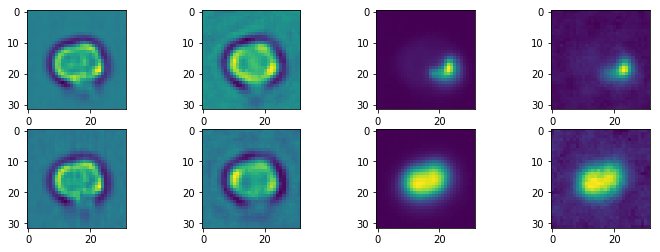

(4, 128, 64)
Epoch:  6 Iteration:  0 Loss:  304.51788
(32, 32, 4) (4, 32, 32, 1)


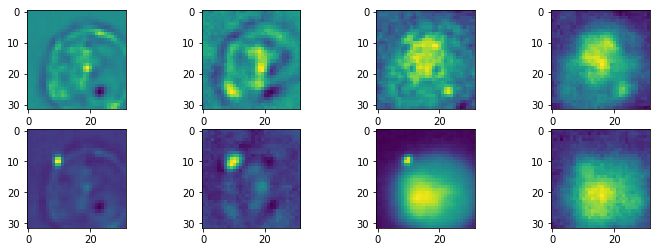

(4, 128, 64)
Epoch:  6 Iteration:  200 Loss:  271.7334
(32, 32, 4) (4, 32, 32, 1)


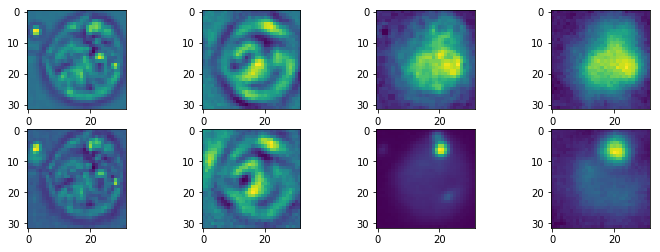

(4, 128, 64)
Epoch:  6 Iteration:  400 Loss:  263.45218
(32, 32, 4) (4, 32, 32, 1)


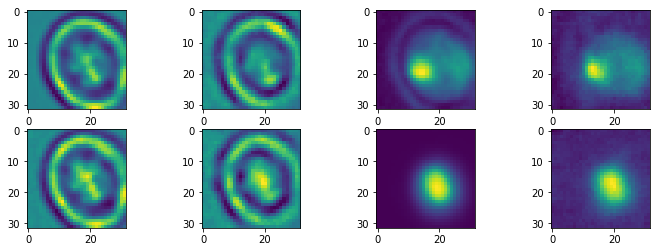

(4, 128, 64)
Epoch:  6 Iteration:  600 Loss:  280.70026
(32, 32, 4) (4, 32, 32, 1)


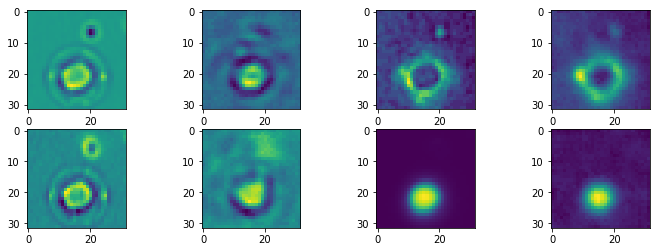

(4, 128, 64)
Epoch:  6 Iteration:  800 Loss:  305.1789
(32, 32, 4) (4, 32, 32, 1)


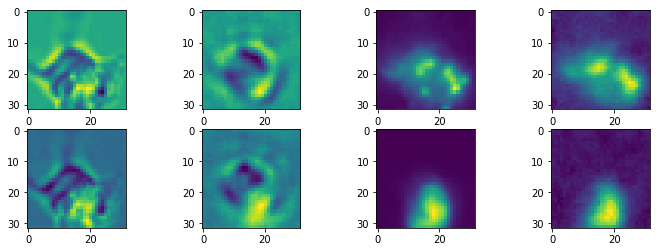

(4, 128, 64)
Epoch:  6 Iteration:  1000 Loss:  277.7049
(32, 32, 4) (4, 32, 32, 1)


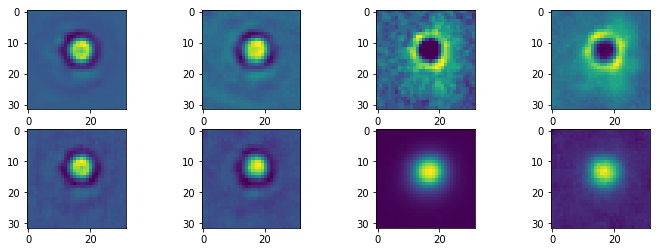

(4, 128, 64)
Epoch:  6 Iteration:  1200 Loss:  284.35468
(32, 32, 4) (4, 32, 32, 1)


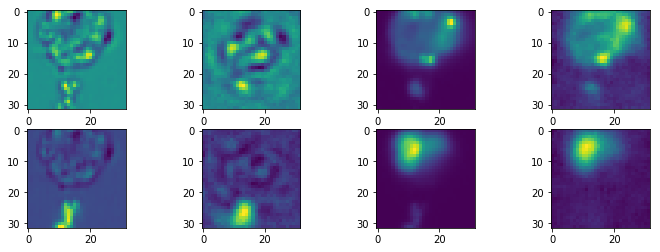

(4, 128, 64)
Epoch:  6 Iteration:  1400 Loss:  279.7395
(32, 32, 4) (4, 32, 32, 1)


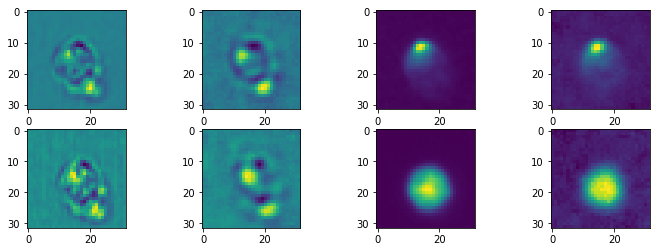

(4, 128, 64)
Epoch:  7 Iteration:  0 Loss:  282.11212
(32, 32, 4) (4, 32, 32, 1)


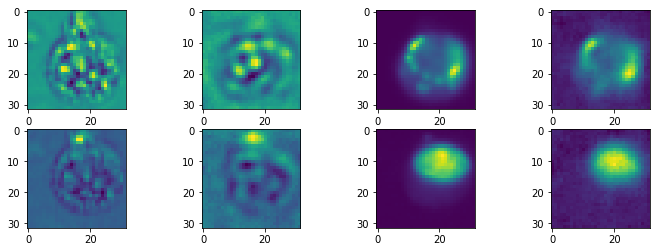

(4, 128, 64)
Epoch:  7 Iteration:  200 Loss:  256.49832
(32, 32, 4) (4, 32, 32, 1)


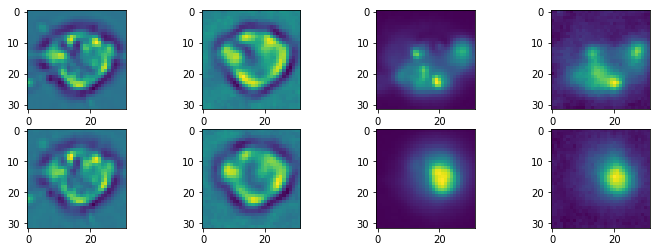

(4, 128, 64)
Epoch:  7 Iteration:  400 Loss:  238.73776
(32, 32, 4) (4, 32, 32, 1)


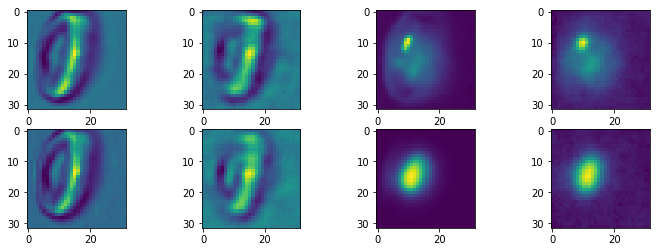

(4, 128, 64)
Epoch:  7 Iteration:  600 Loss:  257.65802
(32, 32, 4) (4, 32, 32, 1)


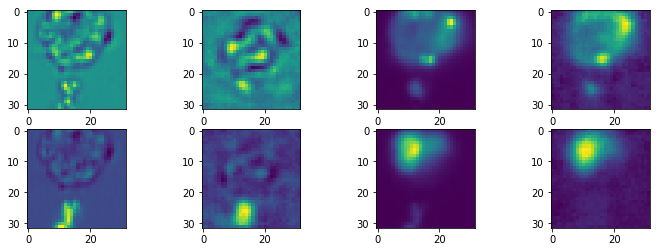

(4, 128, 64)
Epoch:  7 Iteration:  800 Loss:  283.22638
(32, 32, 4) (4, 32, 32, 1)


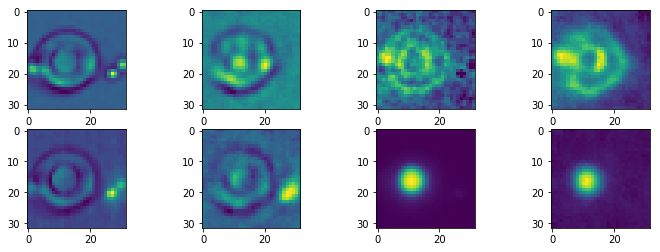

(4, 128, 64)
Epoch:  7 Iteration:  1000 Loss:  254.75327
(32, 32, 4) (4, 32, 32, 1)


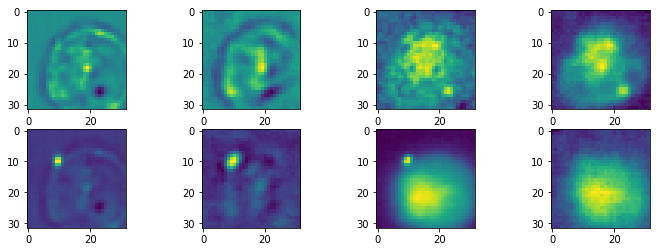

(4, 128, 64)
Epoch:  7 Iteration:  1200 Loss:  261.18893
(32, 32, 4) (4, 32, 32, 1)


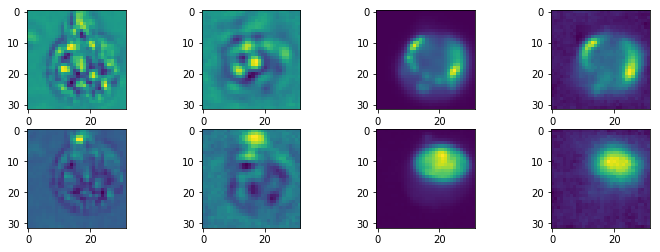

(4, 128, 64)
Epoch:  7 Iteration:  1400 Loss:  259.46396
(32, 32, 4) (4, 32, 32, 1)


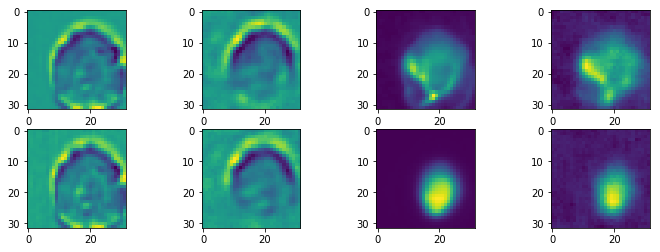

(4, 128, 64)
Epoch:  8 Iteration:  0 Loss:  258.9164
(32, 32, 4) (4, 32, 32, 1)


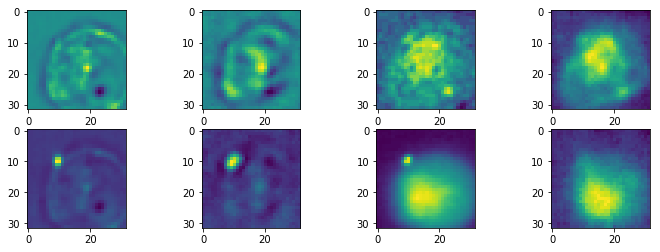

(4, 128, 64)
Epoch:  8 Iteration:  200 Loss:  238.03745
(32, 32, 4) (4, 32, 32, 1)


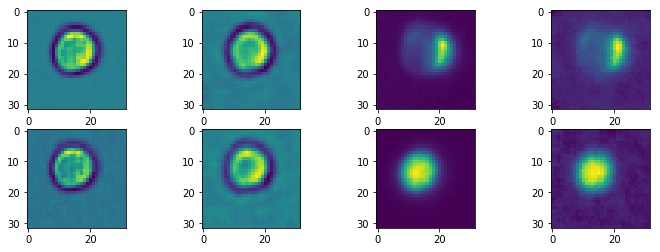

(4, 128, 64)
Epoch:  8 Iteration:  400 Loss:  223.96625
(32, 32, 4) (4, 32, 32, 1)


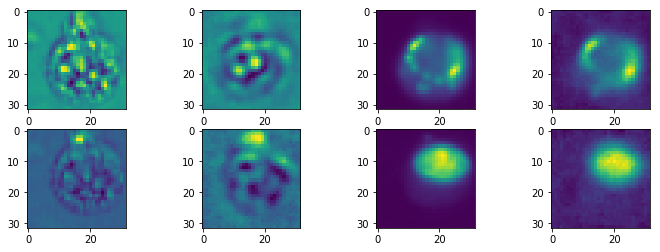

(4, 128, 64)
Epoch:  8 Iteration:  600 Loss:  240.62329
(32, 32, 4) (4, 32, 32, 1)


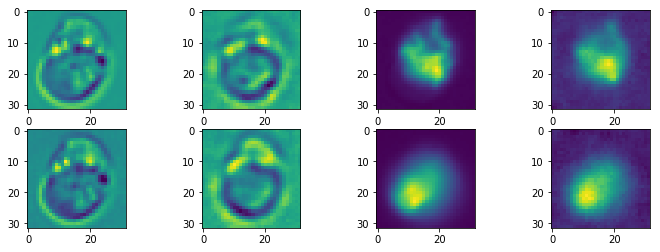

(4, 128, 64)
Epoch:  8 Iteration:  800 Loss:  258.39587
(32, 32, 4) (4, 32, 32, 1)


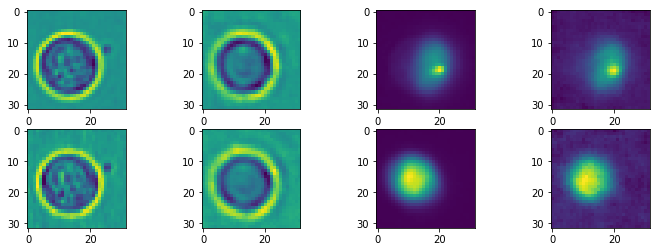

(4, 128, 64)
Epoch:  8 Iteration:  1000 Loss:  238.67905
(32, 32, 4) (4, 32, 32, 1)


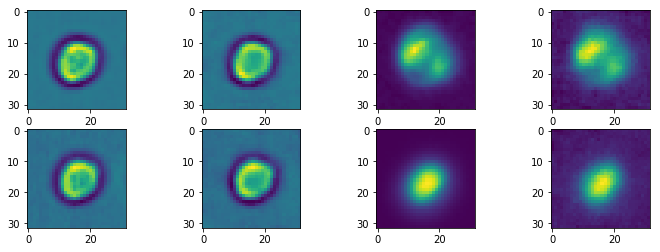

(4, 128, 64)
Epoch:  8 Iteration:  1200 Loss:  241.77368
(32, 32, 4) (4, 32, 32, 1)


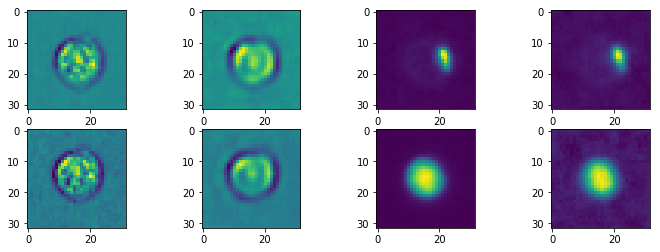

(4, 128, 64)
Epoch:  8 Iteration:  1400 Loss:  242.09097
(32, 32, 4) (4, 32, 32, 1)


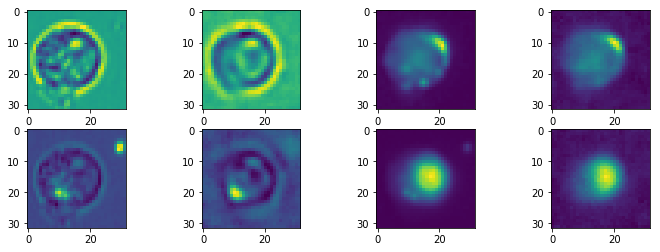

(4, 128, 64)
Epoch:  9 Iteration:  0 Loss:  246.62985
(32, 32, 4) (4, 32, 32, 1)


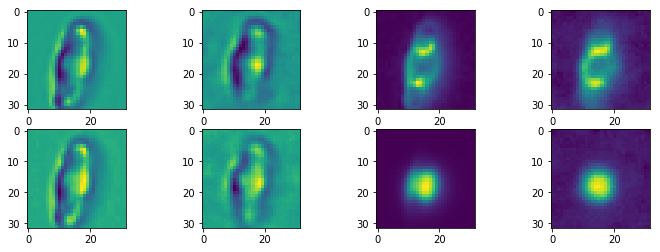

(4, 128, 64)
Epoch:  9 Iteration:  200 Loss:  224.31133
(32, 32, 4) (4, 32, 32, 1)


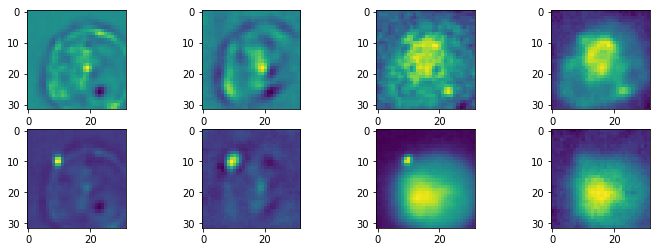

(4, 128, 64)
Epoch:  9 Iteration:  400 Loss:  210.47699
(32, 32, 4) (4, 32, 32, 1)


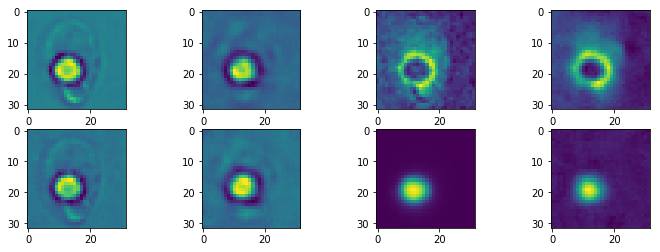

(4, 128, 64)
Epoch:  9 Iteration:  600 Loss:  227.61505
(32, 32, 4) (4, 32, 32, 1)


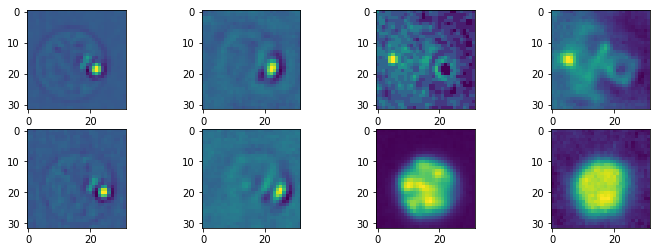

(4, 128, 64)
Epoch:  9 Iteration:  800 Loss:  245.70648
(32, 32, 4) (4, 32, 32, 1)


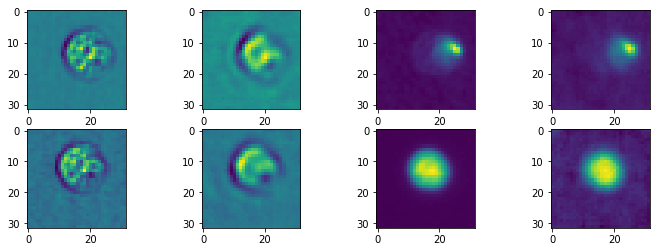

(4, 128, 64)
Epoch:  9 Iteration:  1000 Loss:  225.35678
(32, 32, 4) (4, 32, 32, 1)


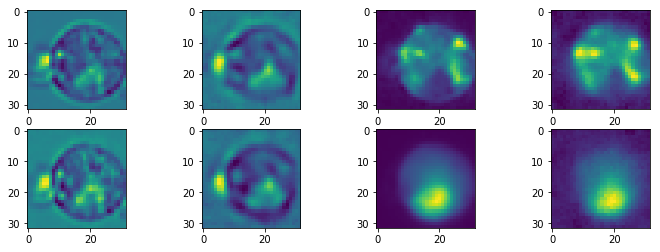

(4, 128, 64)
Epoch:  9 Iteration:  1200 Loss:  226.19925
(32, 32, 4) (4, 32, 32, 1)


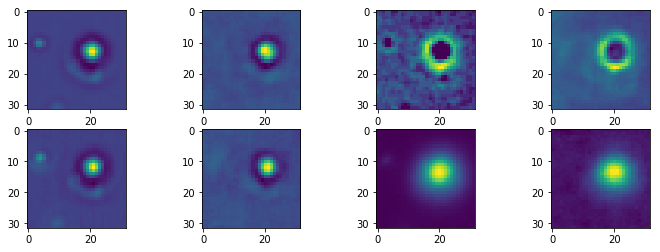

(4, 128, 64)
Epoch:  9 Iteration:  1400 Loss:  228.97437
(32, 32, 4) (4, 32, 32, 1)


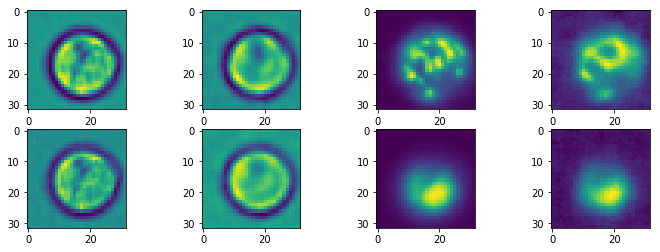

(4, 128, 64)
Epoch:  10 Iteration:  0 Loss:  232.95703
(32, 32, 4) (4, 32, 32, 1)


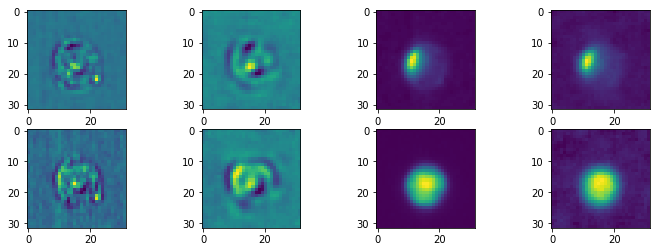

(4, 128, 64)
Epoch:  10 Iteration:  200 Loss:  211.32939
(32, 32, 4) (4, 32, 32, 1)


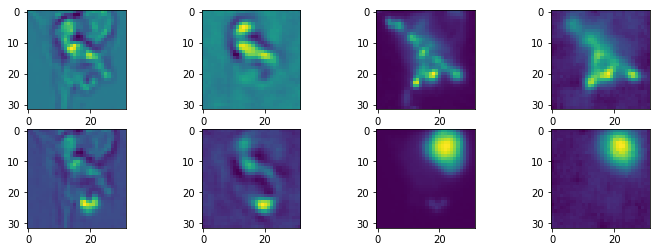

(4, 128, 64)
Epoch:  10 Iteration:  400 Loss:  199.63104
(32, 32, 4) (4, 32, 32, 1)


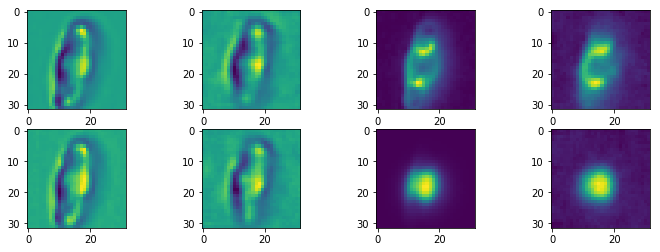

(4, 128, 64)
Epoch:  10 Iteration:  600 Loss:  214.10968
(32, 32, 4) (4, 32, 32, 1)


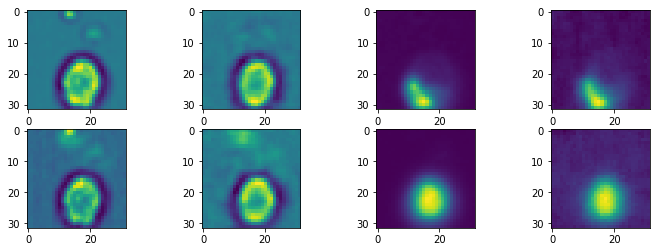

(4, 128, 64)
Epoch:  10 Iteration:  800 Loss:  234.9654
(32, 32, 4) (4, 32, 32, 1)


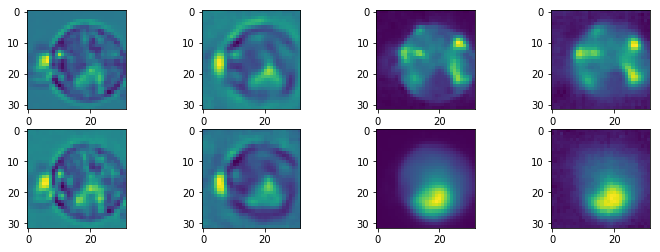

(4, 128, 64)
Epoch:  10 Iteration:  1000 Loss:  215.1153
(32, 32, 4) (4, 32, 32, 1)


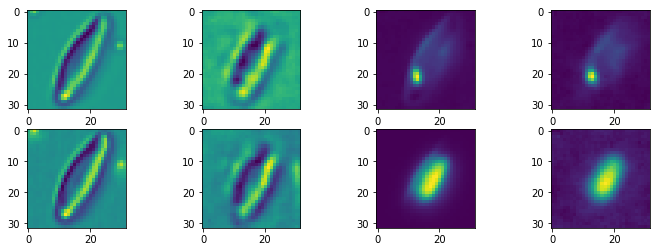

(4, 128, 64)
Epoch:  10 Iteration:  1200 Loss:  217.78912
(32, 32, 4) (4, 32, 32, 1)


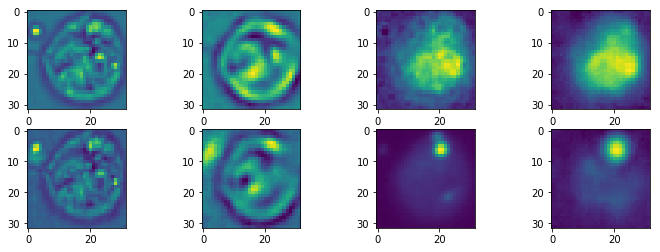

(4, 128, 64)
Epoch:  10 Iteration:  1400 Loss:  217.79935
(32, 32, 4) (4, 32, 32, 1)


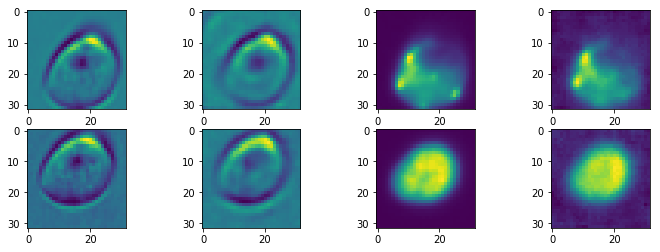

(4, 128, 64)
Epoch:  11 Iteration:  0 Loss:  222.27115
(32, 32, 4) (4, 32, 32, 1)


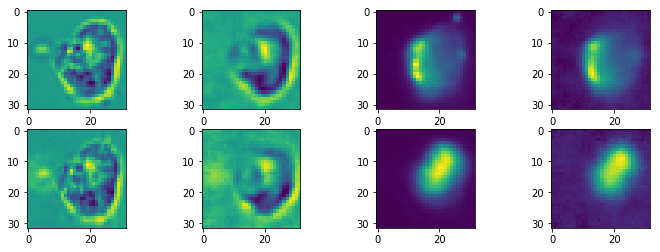

(4, 128, 64)
Epoch:  11 Iteration:  200 Loss:  201.03183
(32, 32, 4) (4, 32, 32, 1)


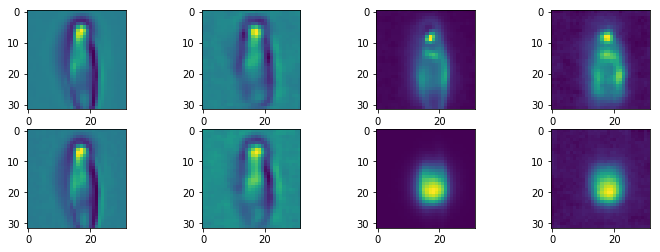

(4, 128, 64)
Epoch:  11 Iteration:  400 Loss:  191.75989
(32, 32, 4) (4, 32, 32, 1)


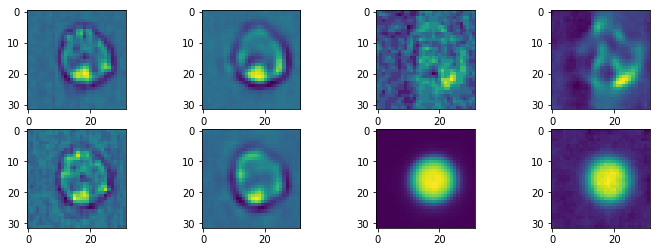

(4, 128, 64)
Epoch:  11 Iteration:  600 Loss:  206.88367
(32, 32, 4) (4, 32, 32, 1)


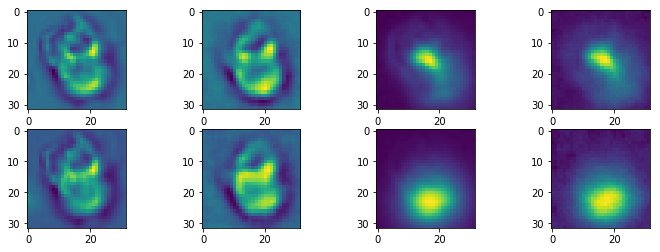

(4, 128, 64)
Epoch:  11 Iteration:  800 Loss:  229.00362
(32, 32, 4) (4, 32, 32, 1)


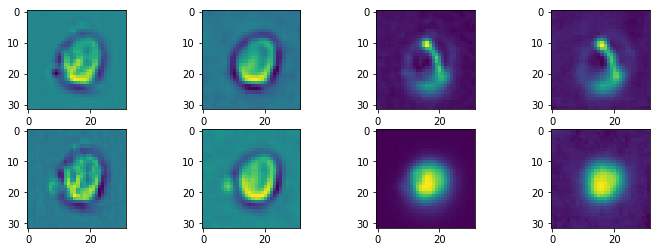

(4, 128, 64)
Epoch:  11 Iteration:  1000 Loss:  205.94778
(32, 32, 4) (4, 32, 32, 1)


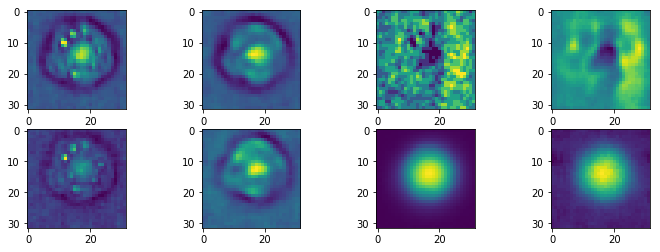

(4, 128, 64)
Epoch:  11 Iteration:  1200 Loss:  214.51308
(32, 32, 4) (4, 32, 32, 1)


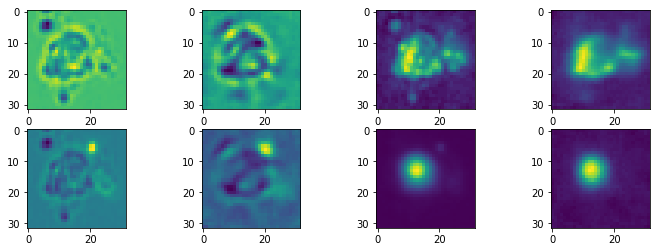

(4, 128, 64)
Epoch:  11 Iteration:  1400 Loss:  212.54776
(32, 32, 4) (4, 32, 32, 1)


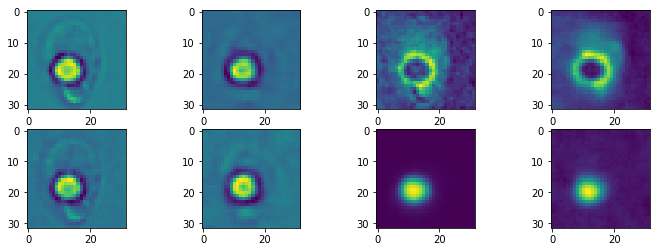

(4, 128, 64)
Epoch:  12 Iteration:  0 Loss:  213.8233
(32, 32, 4) (4, 32, 32, 1)


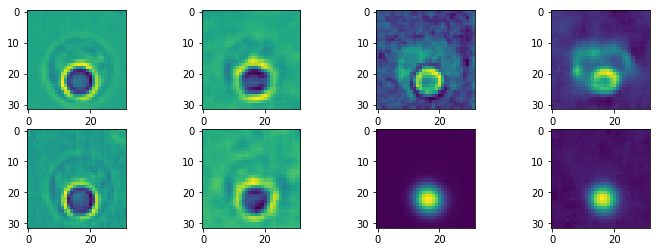

(4, 128, 64)
Epoch:  12 Iteration:  200 Loss:  196.67572
(32, 32, 4) (4, 32, 32, 1)


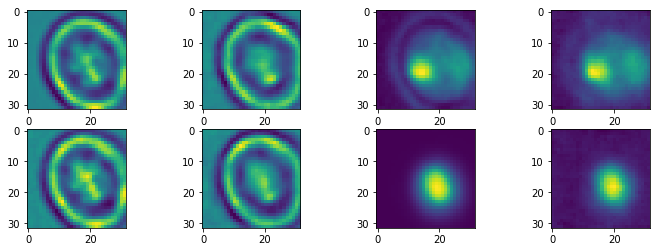

(4, 128, 64)
Epoch:  12 Iteration:  400 Loss:  184.18448
(32, 32, 4) (4, 32, 32, 1)


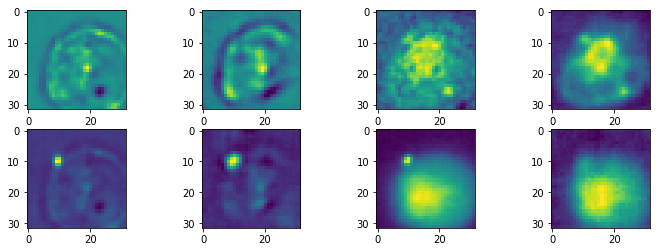

(4, 128, 64)
Epoch:  12 Iteration:  600 Loss:  199.87415
(32, 32, 4) (4, 32, 32, 1)


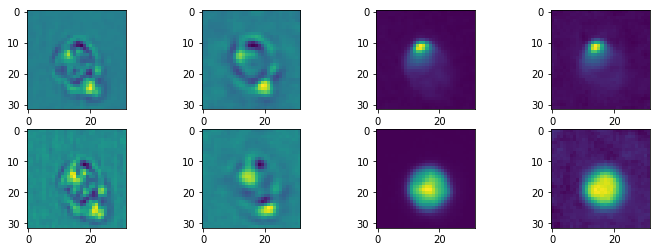

(4, 128, 64)
Epoch:  12 Iteration:  800 Loss:  216.86743
(32, 32, 4) (4, 32, 32, 1)


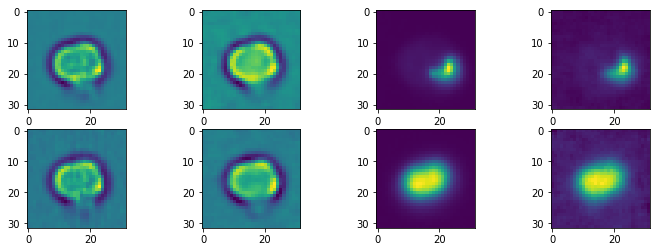

(4, 128, 64)
Epoch:  12 Iteration:  1000 Loss:  202.36507
(32, 32, 4) (4, 32, 32, 1)


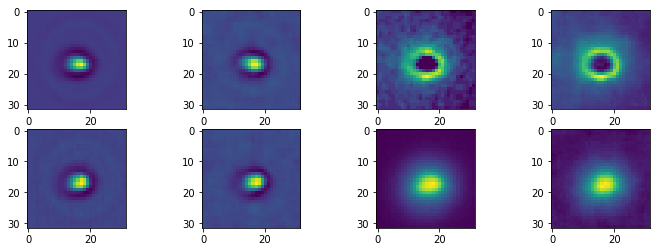

(4, 128, 64)
Epoch:  12 Iteration:  1200 Loss:  203.01358
(32, 32, 4) (4, 32, 32, 1)


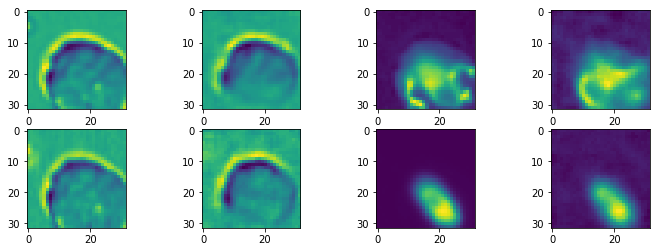

(4, 128, 64)
Epoch:  12 Iteration:  1400 Loss:  205.88329
(32, 32, 4) (4, 32, 32, 1)


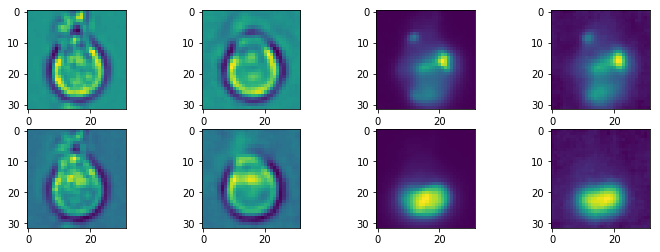

(4, 128, 64)
Epoch:  13 Iteration:  0 Loss:  209.51408
(32, 32, 4) (4, 32, 32, 1)


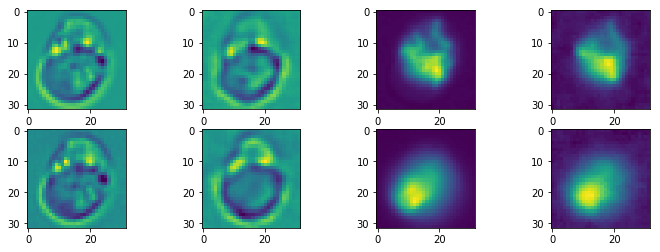

(4, 128, 64)
Epoch:  13 Iteration:  200 Loss:  189.91425
(32, 32, 4) (4, 32, 32, 1)


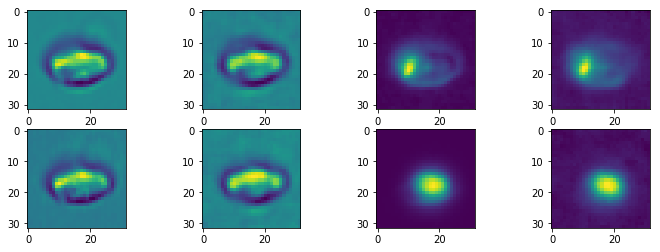

(4, 128, 64)
Epoch:  13 Iteration:  400 Loss:  177.21016
(32, 32, 4) (4, 32, 32, 1)


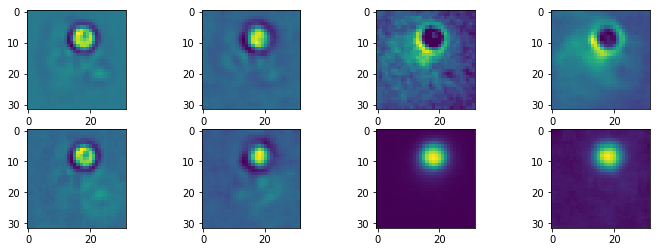

(4, 128, 64)
Epoch:  13 Iteration:  600 Loss:  195.28514
(32, 32, 4) (4, 32, 32, 1)


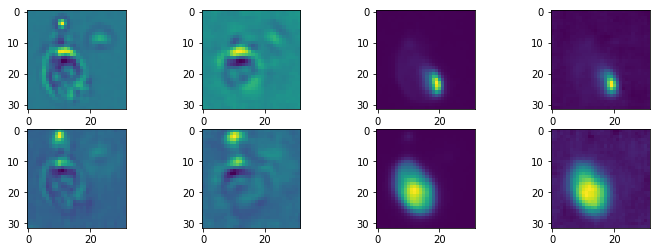

(4, 128, 64)
Epoch:  13 Iteration:  800 Loss:  212.36028
(32, 32, 4) (4, 32, 32, 1)


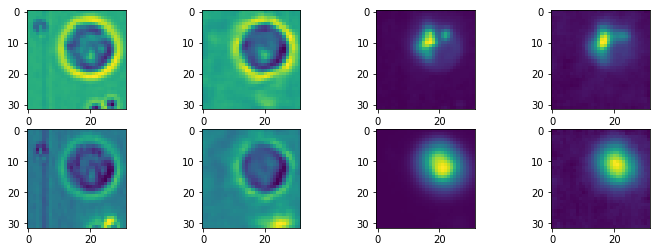

(4, 128, 64)
Epoch:  13 Iteration:  1000 Loss:  195.33481
(32, 32, 4) (4, 32, 32, 1)


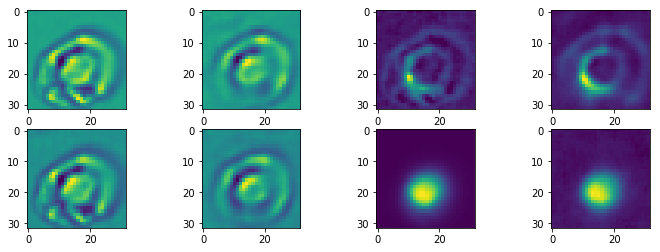

(4, 128, 64)
Epoch:  13 Iteration:  1200 Loss:  201.79572
(32, 32, 4) (4, 32, 32, 1)


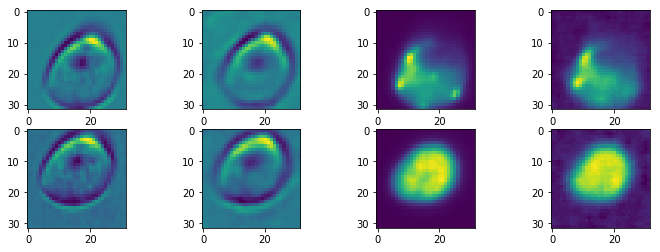

(4, 128, 64)
Epoch:  13 Iteration:  1400 Loss:  200.635
(32, 32, 4) (4, 32, 32, 1)


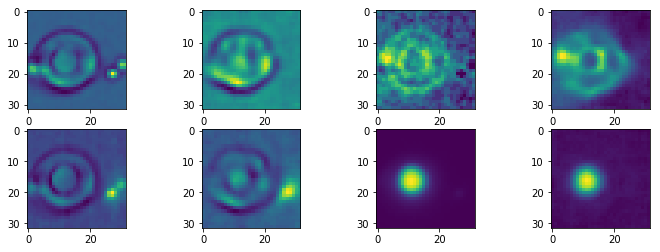

(4, 128, 64)
Epoch:  14 Iteration:  0 Loss:  202.70876
(32, 32, 4) (4, 32, 32, 1)


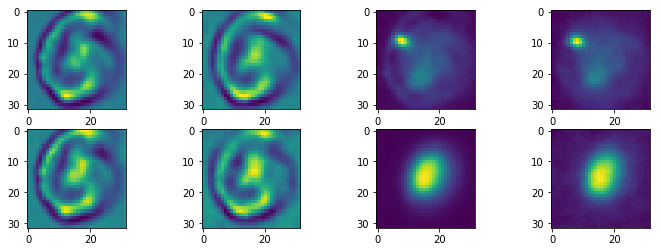

(4, 128, 64)
Epoch:  14 Iteration:  200 Loss:  184.57709
(32, 32, 4) (4, 32, 32, 1)


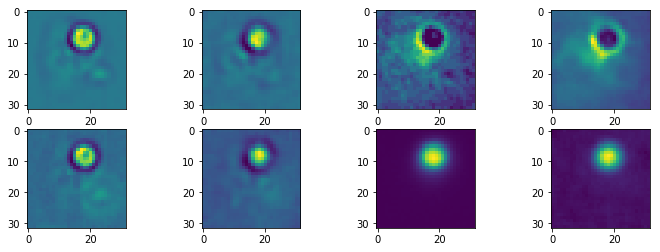

(4, 128, 64)
Epoch:  14 Iteration:  400 Loss:  174.89081
(32, 32, 4) (4, 32, 32, 1)


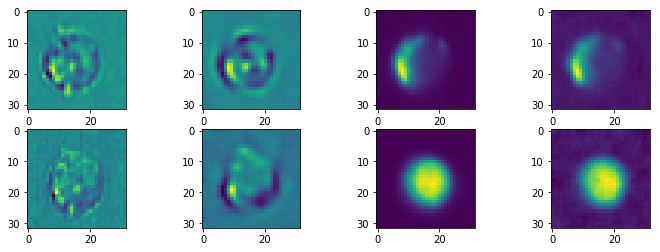

(4, 128, 64)
Epoch:  14 Iteration:  600 Loss:  187.52457
(32, 32, 4) (4, 32, 32, 1)


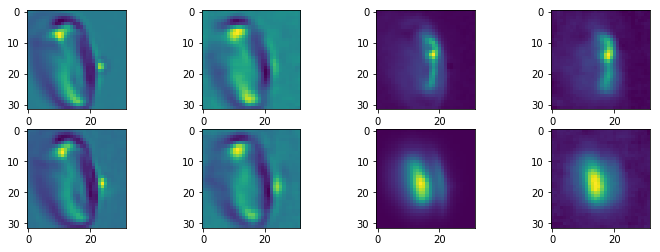

(4, 128, 64)
Epoch:  14 Iteration:  800 Loss:  205.40207
(32, 32, 4) (4, 32, 32, 1)


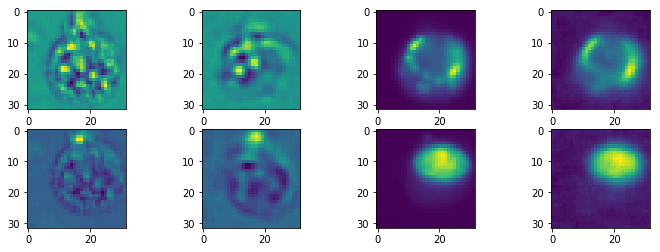

(4, 128, 64)
Epoch:  14 Iteration:  1000 Loss:  191.03094
(32, 32, 4) (4, 32, 32, 1)


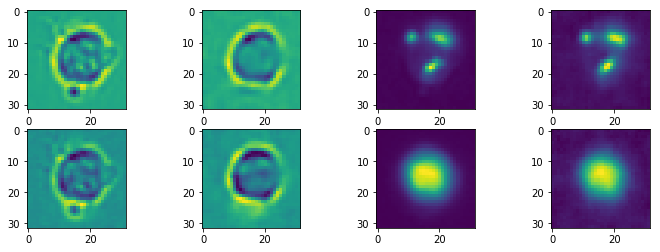

(4, 128, 64)
Epoch:  14 Iteration:  1200 Loss:  197.81258
(32, 32, 4) (4, 32, 32, 1)


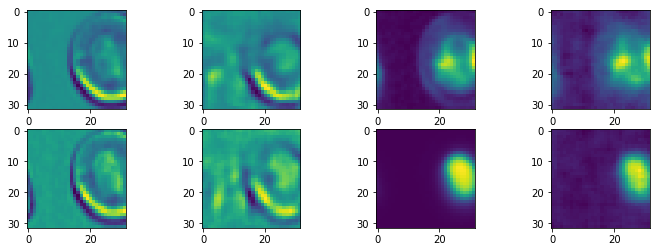

(4, 128, 64)
Epoch:  14 Iteration:  1400 Loss:  196.80937
(32, 32, 4) (4, 32, 32, 1)


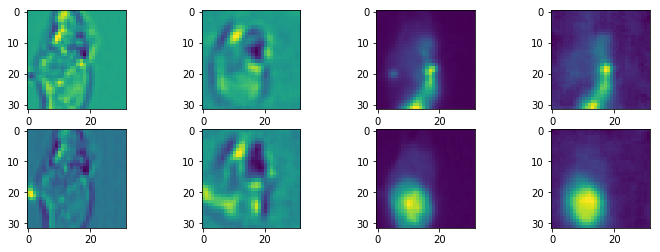

(4, 128, 64)
Epoch:  15 Iteration:  0 Loss:  196.0908
(32, 32, 4) (4, 32, 32, 1)


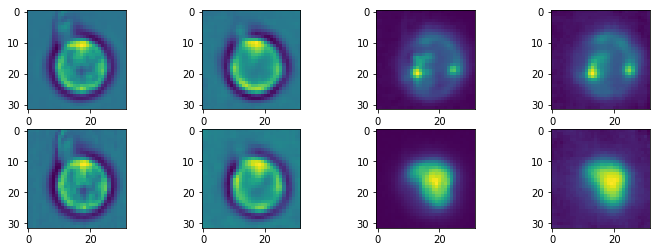

(4, 128, 64)
Epoch:  15 Iteration:  200 Loss:  181.4716
(32, 32, 4) (4, 32, 32, 1)


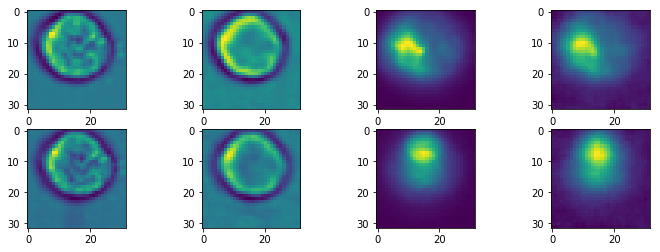

(4, 128, 64)
Epoch:  15 Iteration:  400 Loss:  168.75714
(32, 32, 4) (4, 32, 32, 1)


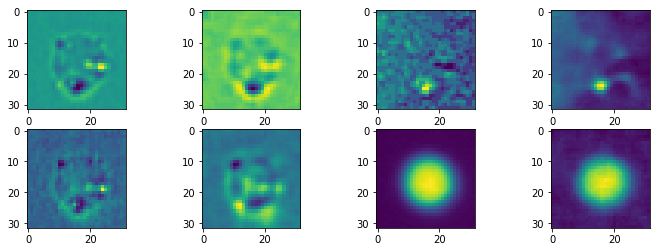

(4, 128, 64)
Epoch:  15 Iteration:  600 Loss:  184.23318
(32, 32, 4) (4, 32, 32, 1)


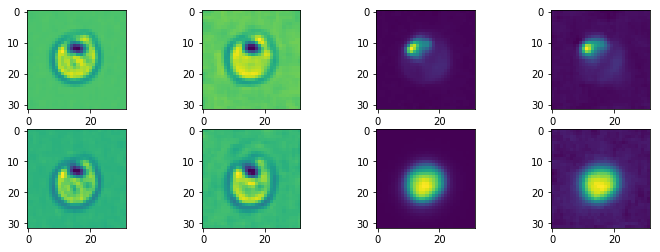

(4, 128, 64)
Epoch:  15 Iteration:  800 Loss:  204.75409
(32, 32, 4) (4, 32, 32, 1)


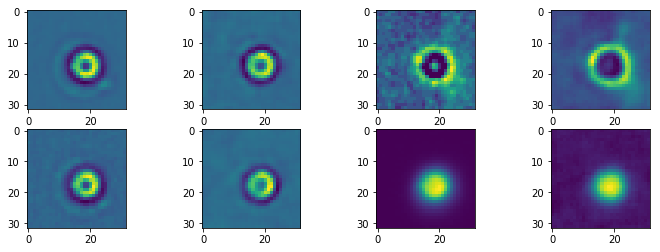

(4, 128, 64)
Epoch:  15 Iteration:  1000 Loss:  188.72134
(32, 32, 4) (4, 32, 32, 1)


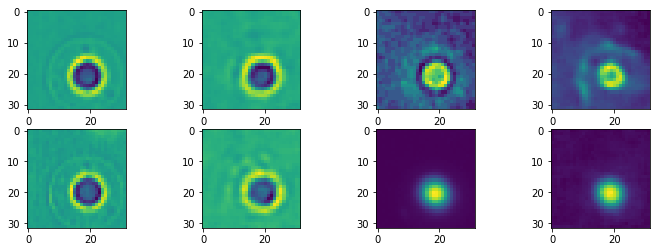

(4, 128, 64)
Epoch:  15 Iteration:  1200 Loss:  189.20825
(32, 32, 4) (4, 32, 32, 1)


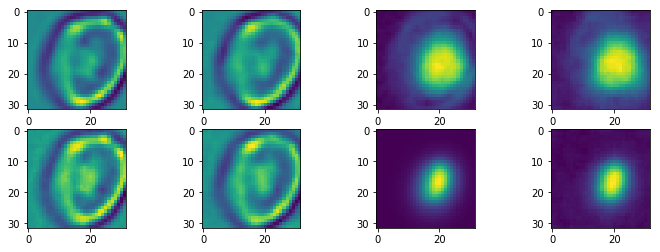

(4, 128, 64)
Epoch:  15 Iteration:  1400 Loss:  191.22766
(32, 32, 4) (4, 32, 32, 1)


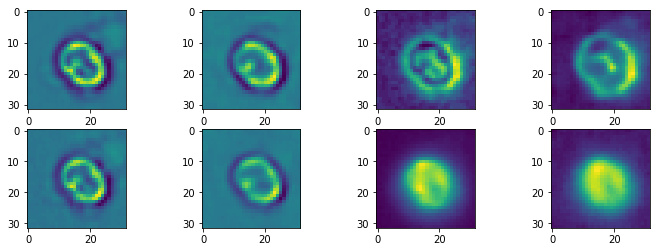

(4, 128, 64)
Epoch:  16 Iteration:  0 Loss:  195.17122
(32, 32, 4) (4, 32, 32, 1)


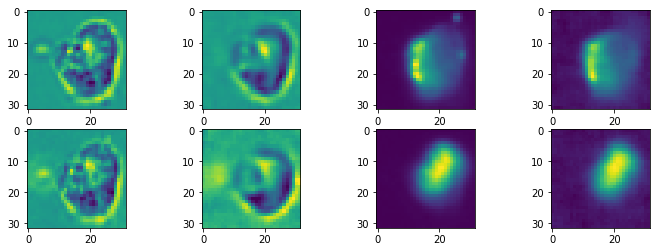

(4, 128, 64)
Epoch:  16 Iteration:  200 Loss:  177.75035
(32, 32, 4) (4, 32, 32, 1)


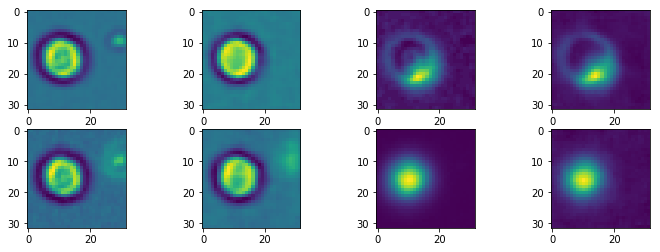

(4, 128, 64)
Epoch:  16 Iteration:  400 Loss:  165.5866
(32, 32, 4) (4, 32, 32, 1)


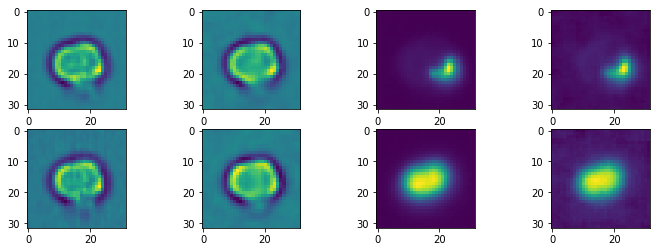

(4, 128, 64)
Epoch:  16 Iteration:  600 Loss:  181.97632
(32, 32, 4) (4, 32, 32, 1)


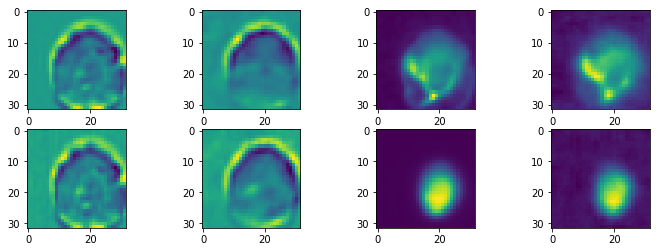

(4, 128, 64)
Epoch:  16 Iteration:  800 Loss:  201.13806
(32, 32, 4) (4, 32, 32, 1)


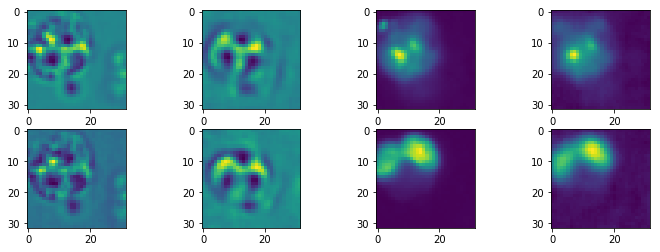

(4, 128, 64)
Epoch:  16 Iteration:  1000 Loss:  184.26506
(32, 32, 4) (4, 32, 32, 1)


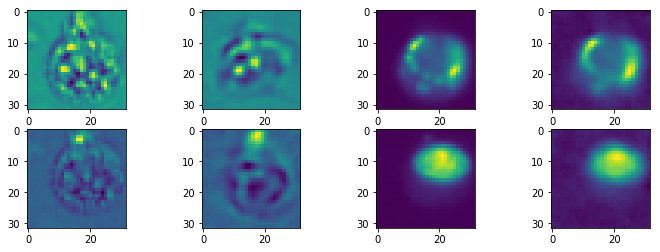

(4, 128, 64)
Epoch:  16 Iteration:  1200 Loss:  186.48082
(32, 32, 4) (4, 32, 32, 1)


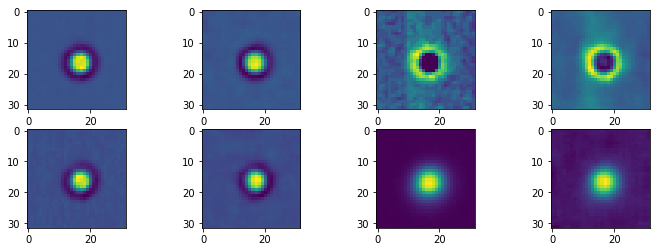

(4, 128, 64)
Epoch:  16 Iteration:  1400 Loss:  186.50638
(32, 32, 4) (4, 32, 32, 1)


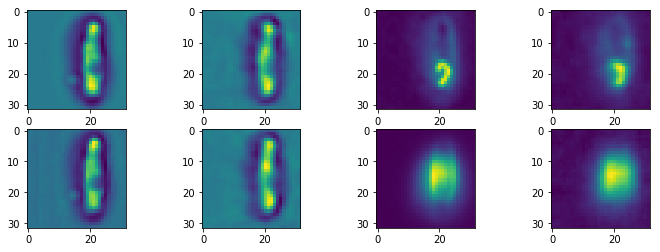

(4, 128, 64)
Epoch:  17 Iteration:  0 Loss:  190.78986
(32, 32, 4) (4, 32, 32, 1)


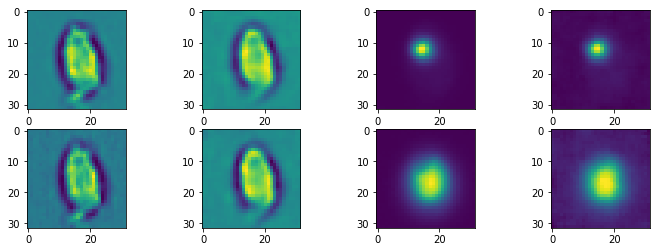

(4, 128, 64)
Epoch:  17 Iteration:  200 Loss:  174.05373
(32, 32, 4) (4, 32, 32, 1)


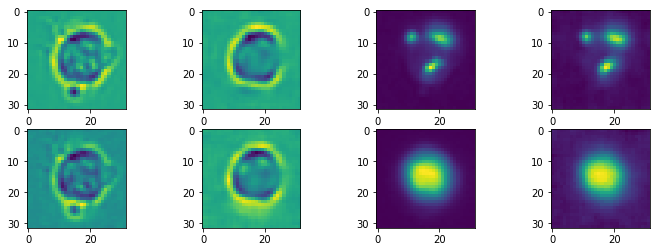

(4, 128, 64)
Epoch:  17 Iteration:  400 Loss:  161.747
(32, 32, 4) (4, 32, 32, 1)


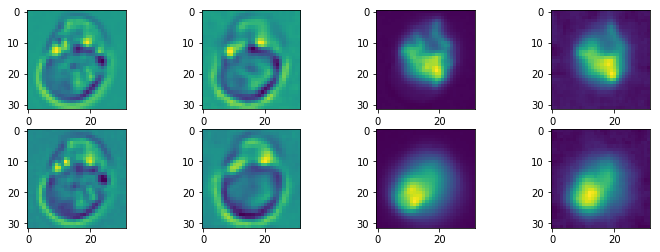

(4, 128, 64)
Epoch:  17 Iteration:  600 Loss:  176.45888
(32, 32, 4) (4, 32, 32, 1)


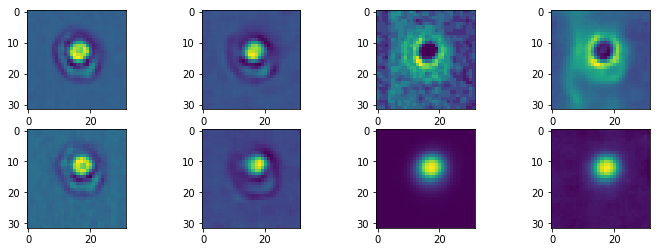

(4, 128, 64)
Epoch:  17 Iteration:  800 Loss:  196.91342
(32, 32, 4) (4, 32, 32, 1)


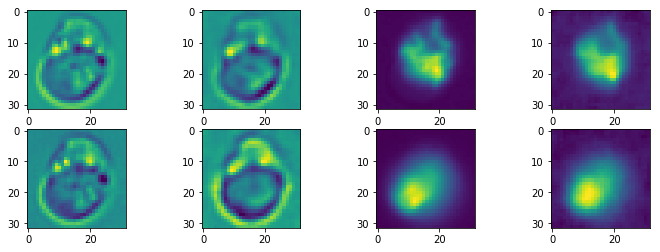

(4, 128, 64)
Epoch:  17 Iteration:  1000 Loss:  181.01797
(32, 32, 4) (4, 32, 32, 1)


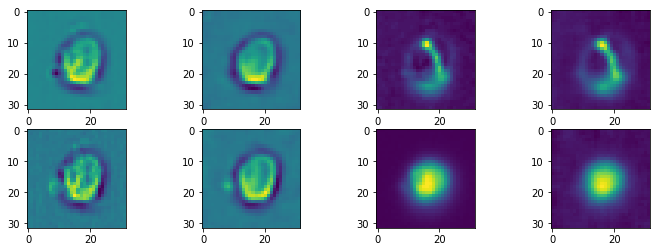

(4, 128, 64)
Epoch:  17 Iteration:  1200 Loss:  182.32141
(32, 32, 4) (4, 32, 32, 1)


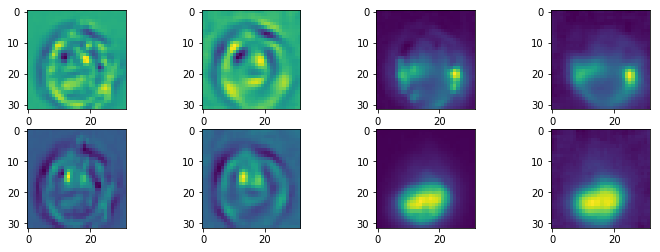

(4, 128, 64)
Epoch:  17 Iteration:  1400 Loss:  186.95107
(32, 32, 4) (4, 32, 32, 1)


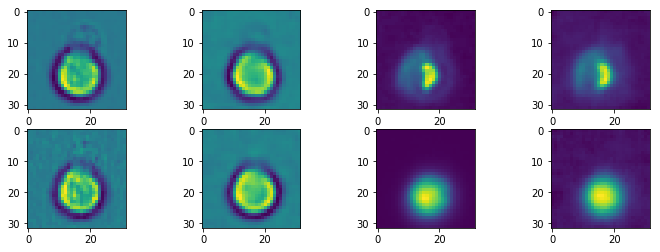

(4, 128, 64)
Epoch:  18 Iteration:  0 Loss:  188.57596
(32, 32, 4) (4, 32, 32, 1)


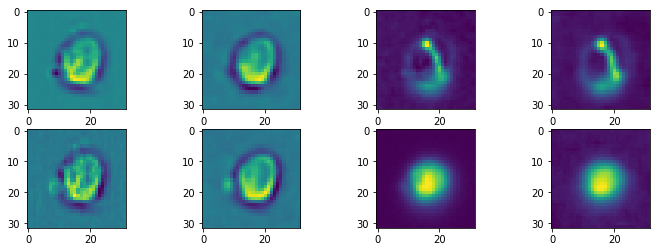

(4, 128, 64)
Epoch:  18 Iteration:  200 Loss:  171.43552
(32, 32, 4) (4, 32, 32, 1)


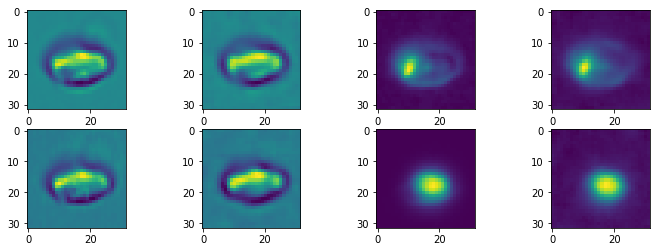

(4, 128, 64)
Epoch:  18 Iteration:  400 Loss:  158.1272
(32, 32, 4) (4, 32, 32, 1)


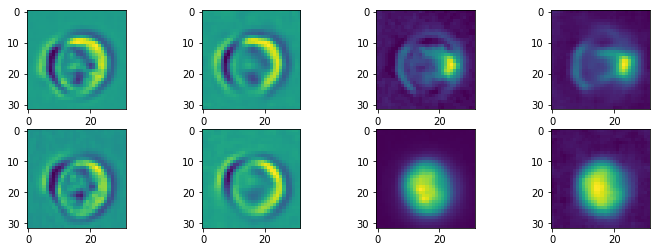

(4, 128, 64)
Epoch:  18 Iteration:  600 Loss:  171.45645
(32, 32, 4) (4, 32, 32, 1)


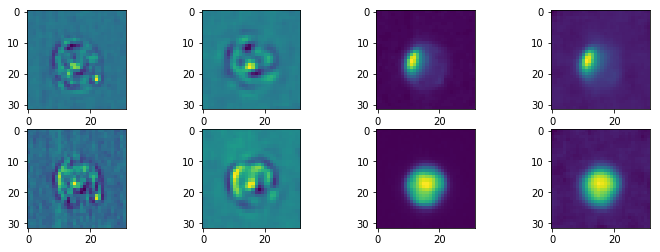

(4, 128, 64)
Epoch:  18 Iteration:  800 Loss:  194.71126
(32, 32, 4) (4, 32, 32, 1)


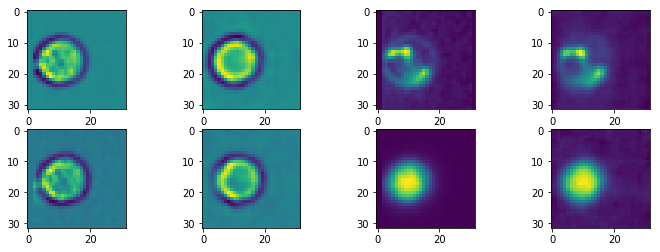

(4, 128, 64)
Epoch:  18 Iteration:  1000 Loss:  177.82477
(32, 32, 4) (4, 32, 32, 1)


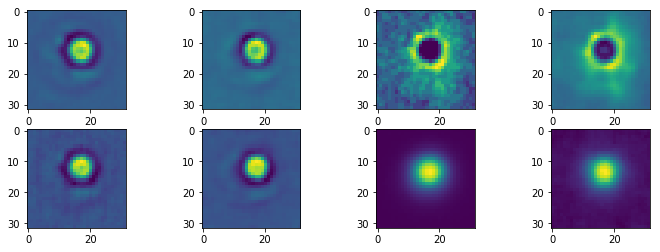

(4, 128, 64)
Epoch:  18 Iteration:  1200 Loss:  181.78635
(32, 32, 4) (4, 32, 32, 1)


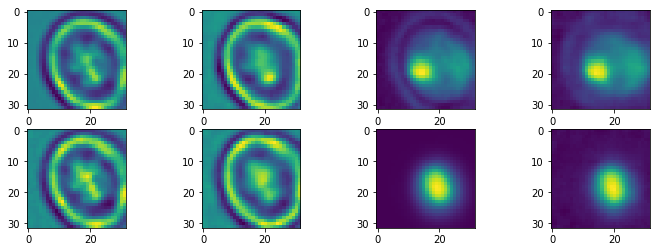

(4, 128, 64)
Epoch:  18 Iteration:  1400 Loss:  183.48795
(32, 32, 4) (4, 32, 32, 1)


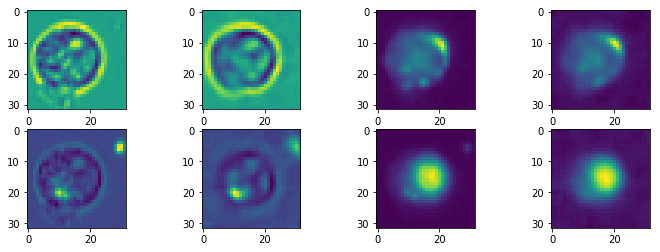

(4, 128, 64)
Epoch:  19 Iteration:  0 Loss:  186.84796
(32, 32, 4) (4, 32, 32, 1)


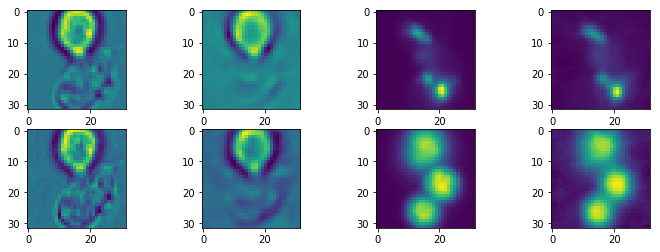

(4, 128, 64)
Epoch:  19 Iteration:  200 Loss:  169.42876
(32, 32, 4) (4, 32, 32, 1)


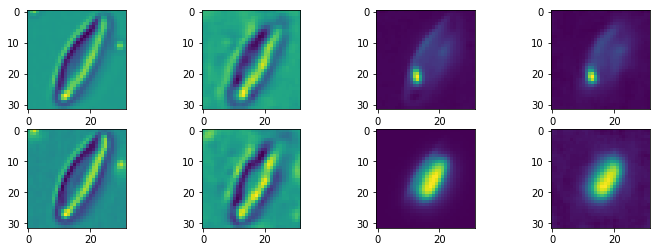

(4, 128, 64)
Epoch:  19 Iteration:  400 Loss:  157.41302
(32, 32, 4) (4, 32, 32, 1)


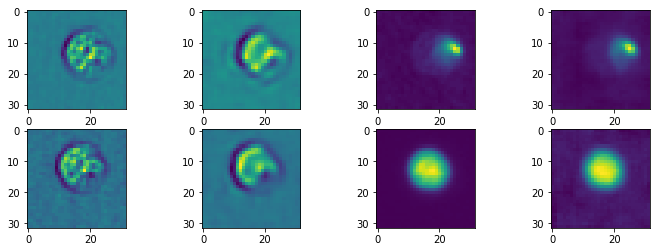

(4, 128, 64)
Epoch:  19 Iteration:  600 Loss:  174.54959
(32, 32, 4) (4, 32, 32, 1)


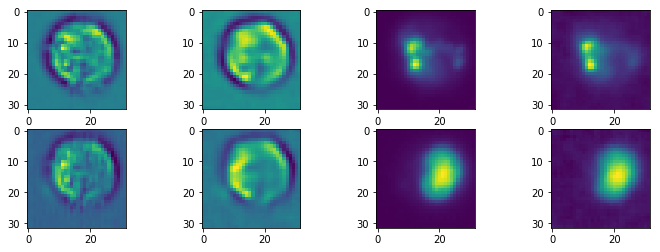

(4, 128, 64)
Epoch:  19 Iteration:  800 Loss:  192.51088
(32, 32, 4) (4, 32, 32, 1)


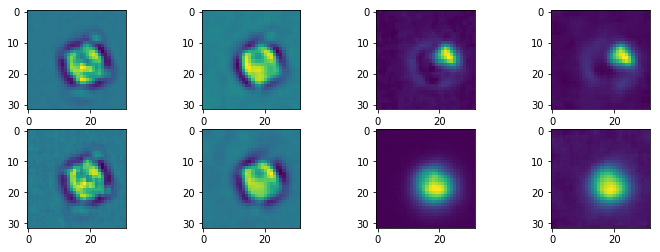

(4, 128, 64)
Epoch:  19 Iteration:  1000 Loss:  175.99823
(32, 32, 4) (4, 32, 32, 1)


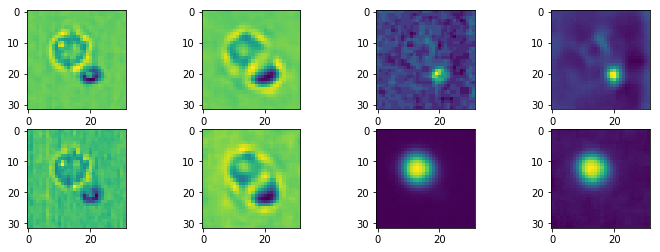

(4, 128, 64)
Epoch:  19 Iteration:  1200 Loss:  178.43964
(32, 32, 4) (4, 32, 32, 1)


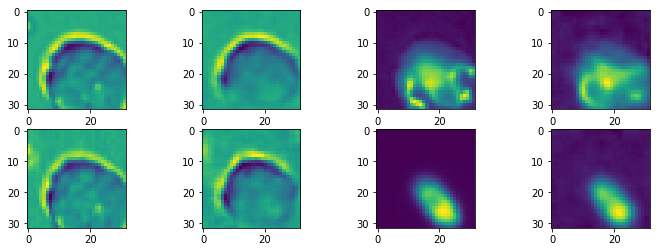

(4, 128, 64)
Epoch:  19 Iteration:  1400 Loss:  180.14624
(32, 32, 4) (4, 32, 32, 1)


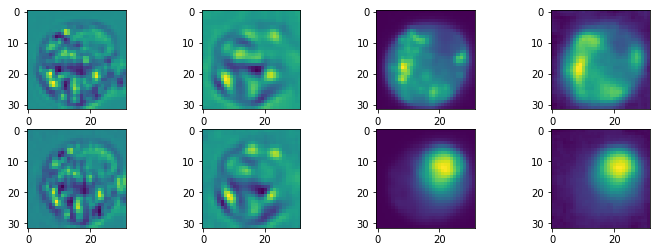

(4, 128, 64)
Epoch:  20 Iteration:  0 Loss:  183.25006
(32, 32, 4) (4, 32, 32, 1)


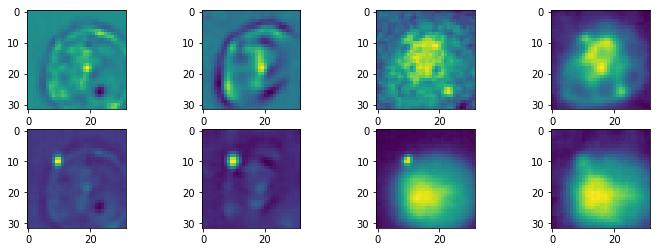

(4, 128, 64)
Epoch:  20 Iteration:  200 Loss:  167.8397
(32, 32, 4) (4, 32, 32, 1)


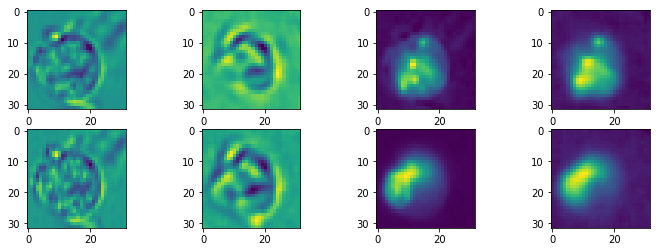

(4, 128, 64)
Epoch:  20 Iteration:  400 Loss:  153.01993
(32, 32, 4) (4, 32, 32, 1)


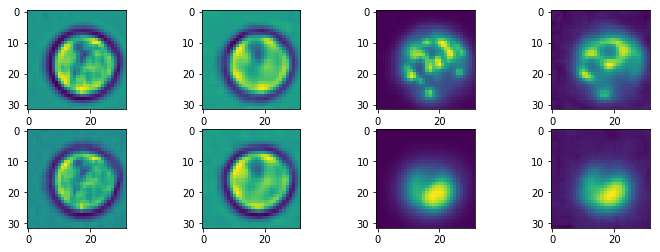

(4, 128, 64)
Epoch:  20 Iteration:  600 Loss:  170.4642
(32, 32, 4) (4, 32, 32, 1)


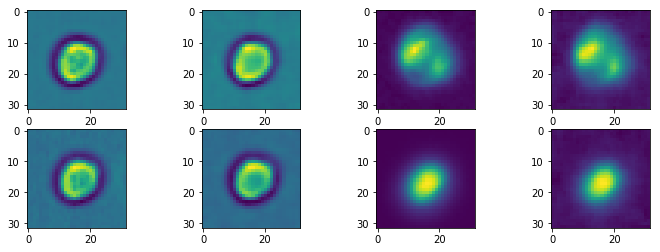

(4, 128, 64)
Epoch:  20 Iteration:  800 Loss:  190.71387
(32, 32, 4) (4, 32, 32, 1)


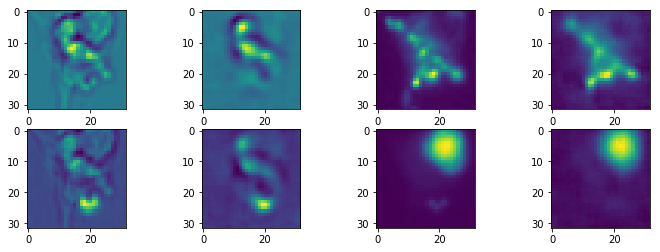

(4, 128, 64)
Epoch:  20 Iteration:  1000 Loss:  174.41714
(32, 32, 4) (4, 32, 32, 1)


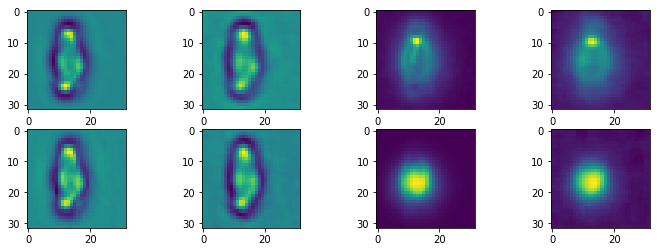

(4, 128, 64)
Epoch:  20 Iteration:  1200 Loss:  177.07521
(32, 32, 4) (4, 32, 32, 1)


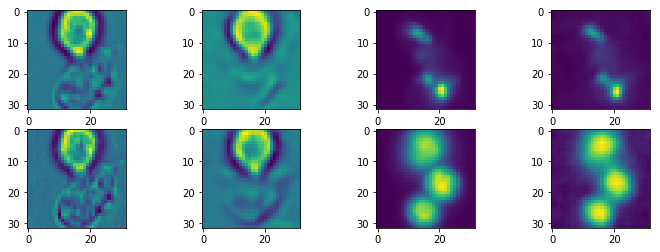

(4, 128, 64)
Epoch:  20 Iteration:  1400 Loss:  177.44623
(32, 32, 4) (4, 32, 32, 1)


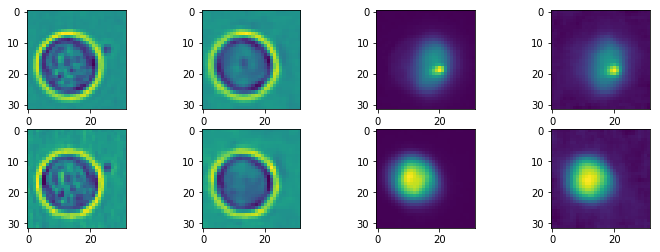

(4, 128, 64)
Epoch:  21 Iteration:  0 Loss:  180.95123
(32, 32, 4) (4, 32, 32, 1)


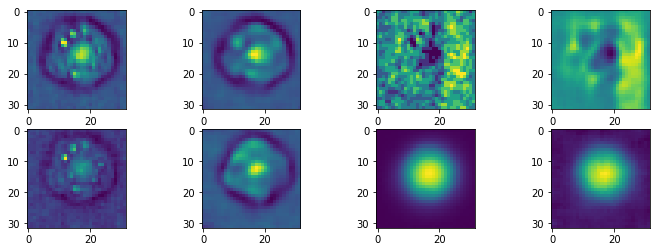

(4, 128, 64)
Epoch:  21 Iteration:  200 Loss:  164.68376
(32, 32, 4) (4, 32, 32, 1)


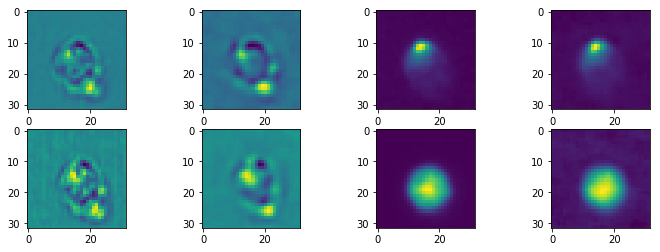

(4, 128, 64)
Epoch:  21 Iteration:  400 Loss:  150.8595
(32, 32, 4) (4, 32, 32, 1)


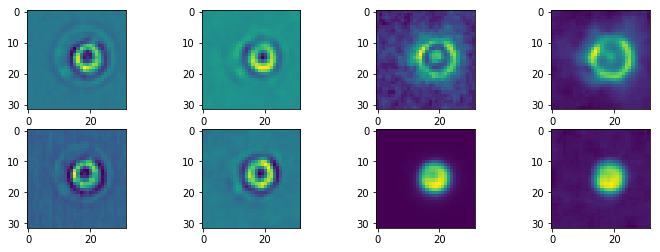

(4, 128, 64)
Epoch:  21 Iteration:  600 Loss:  166.93466
(32, 32, 4) (4, 32, 32, 1)


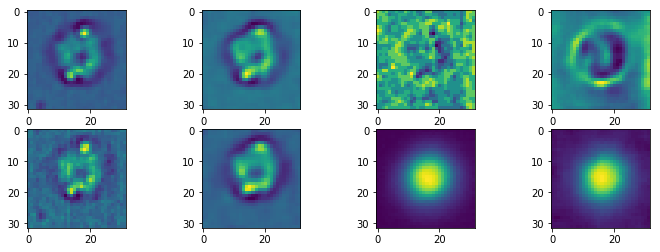

(4, 128, 64)
Epoch:  21 Iteration:  800 Loss:  188.35168
(32, 32, 4) (4, 32, 32, 1)


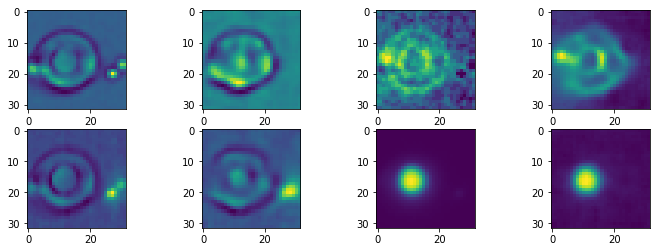

(4, 128, 64)
Epoch:  21 Iteration:  1000 Loss:  172.38315
(32, 32, 4) (4, 32, 32, 1)


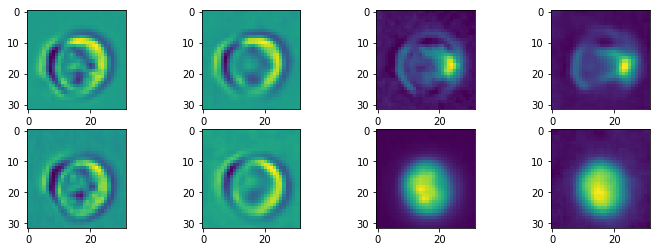

(4, 128, 64)
Epoch:  21 Iteration:  1200 Loss:  175.37529
(32, 32, 4) (4, 32, 32, 1)


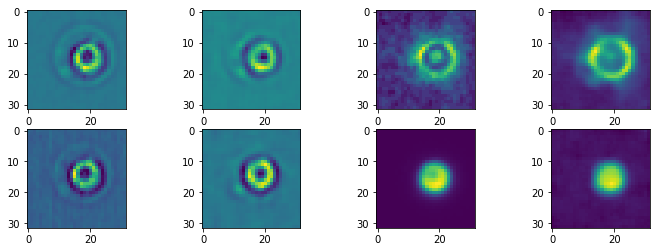

(4, 128, 64)
Epoch:  21 Iteration:  1400 Loss:  176.9454
(32, 32, 4) (4, 32, 32, 1)


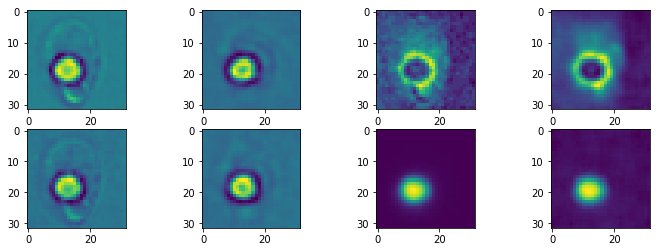

(4, 128, 64)
Epoch:  22 Iteration:  0 Loss:  178.73944
(32, 32, 4) (4, 32, 32, 1)


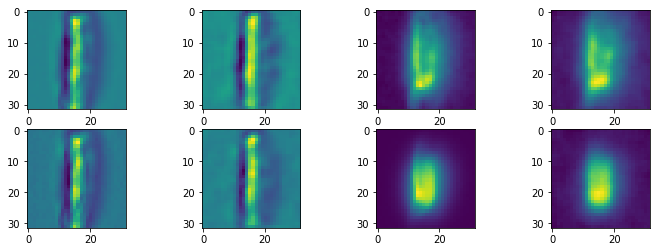

(4, 128, 64)
Epoch:  22 Iteration:  200 Loss:  164.21315
(32, 32, 4) (4, 32, 32, 1)


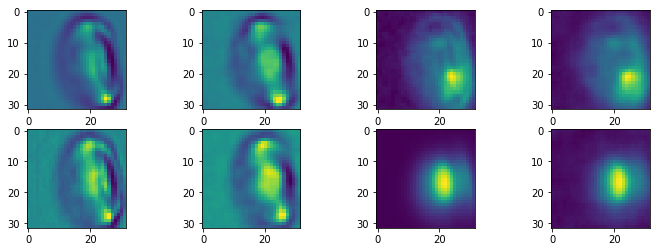

(4, 128, 64)
Epoch:  22 Iteration:  400 Loss:  147.4595
(32, 32, 4) (4, 32, 32, 1)


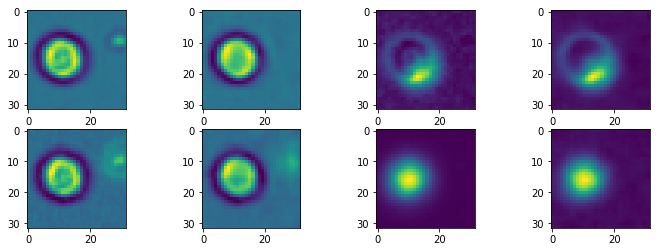

(4, 128, 64)
Epoch:  22 Iteration:  600 Loss:  166.38058
(32, 32, 4) (4, 32, 32, 1)


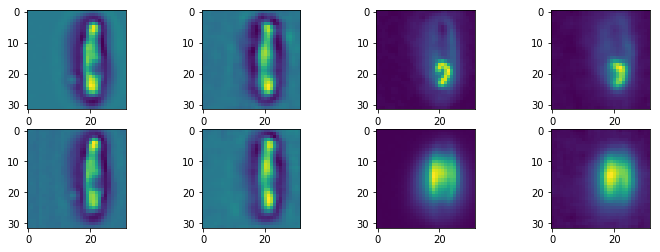

(4, 128, 64)
Epoch:  22 Iteration:  800 Loss:  187.5874
(32, 32, 4) (4, 32, 32, 1)


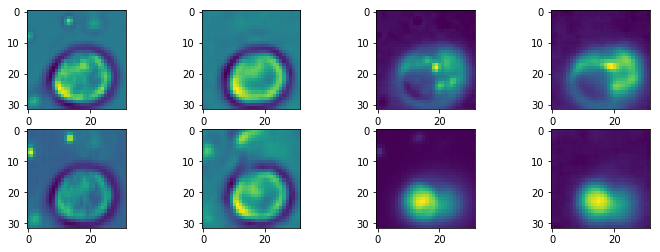

(4, 128, 64)
Epoch:  22 Iteration:  1000 Loss:  170.92877
(32, 32, 4) (4, 32, 32, 1)


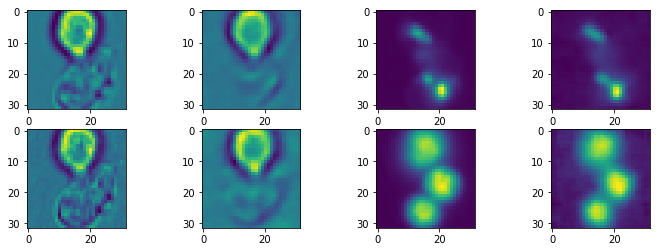

(4, 128, 64)
Epoch:  22 Iteration:  1200 Loss:  172.17465
(32, 32, 4) (4, 32, 32, 1)


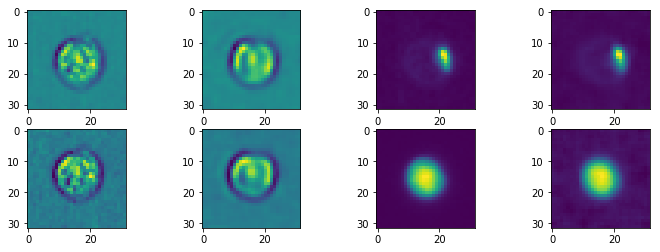

(4, 128, 64)
Epoch:  22 Iteration:  1400 Loss:  174.07582
(32, 32, 4) (4, 32, 32, 1)


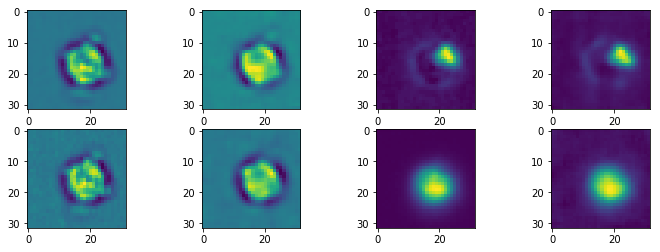

(4, 128, 64)
Epoch:  23 Iteration:  0 Loss:  177.36537
(32, 32, 4) (4, 32, 32, 1)


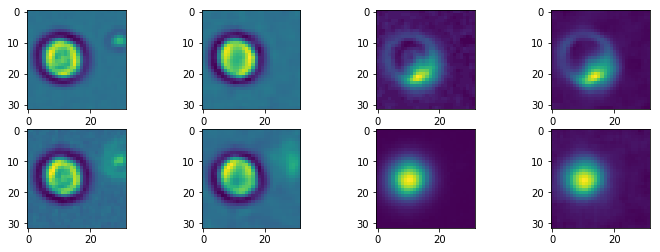

(4, 128, 64)
Epoch:  23 Iteration:  200 Loss:  162.26566
(32, 32, 4) (4, 32, 32, 1)


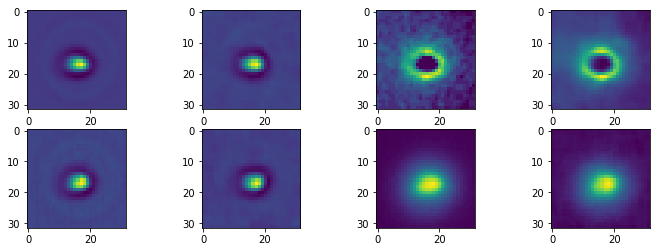

(4, 128, 64)
Epoch:  23 Iteration:  400 Loss:  150.10043
(32, 32, 4) (4, 32, 32, 1)


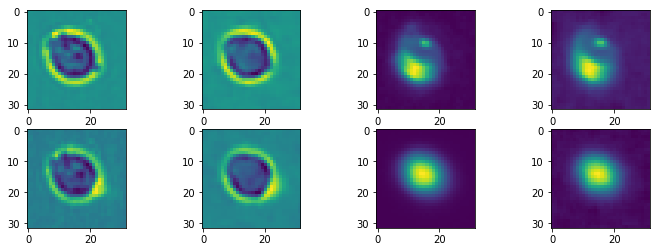

(4, 128, 64)
Epoch:  23 Iteration:  600 Loss:  166.98401
(32, 32, 4) (4, 32, 32, 1)


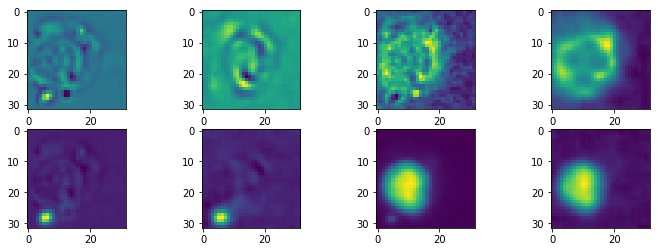

(4, 128, 64)
Epoch:  23 Iteration:  800 Loss:  185.90817
(32, 32, 4) (4, 32, 32, 1)


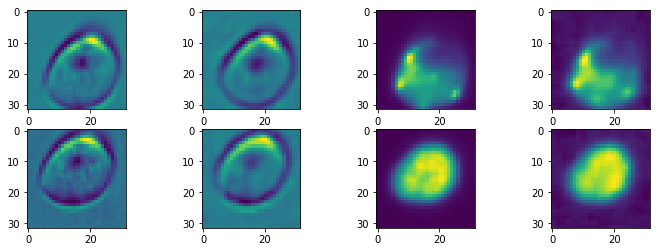

(4, 128, 64)
Epoch:  23 Iteration:  1000 Loss:  169.20996
(32, 32, 4) (4, 32, 32, 1)


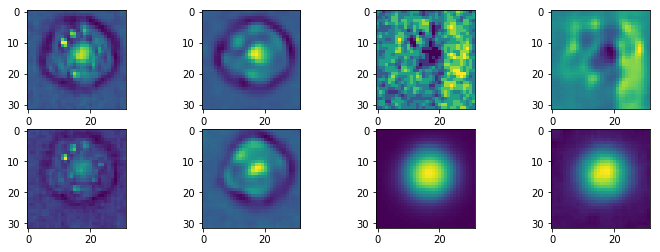

(4, 128, 64)
Epoch:  23 Iteration:  1200 Loss:  172.78271
(32, 32, 4) (4, 32, 32, 1)


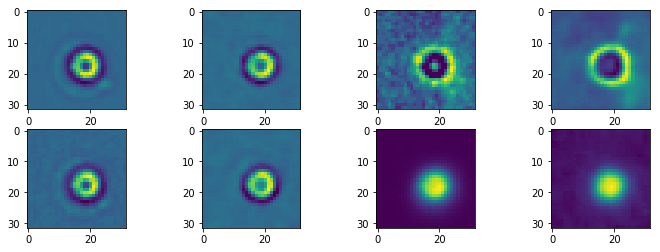

(4, 128, 64)
Epoch:  23 Iteration:  1400 Loss:  172.09048
(32, 32, 4) (4, 32, 32, 1)


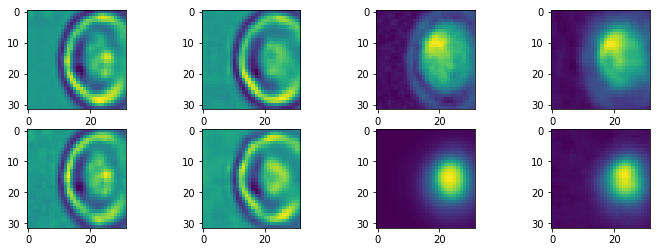

(4, 128, 64)
Epoch:  24 Iteration:  0 Loss:  178.34372
(32, 32, 4) (4, 32, 32, 1)


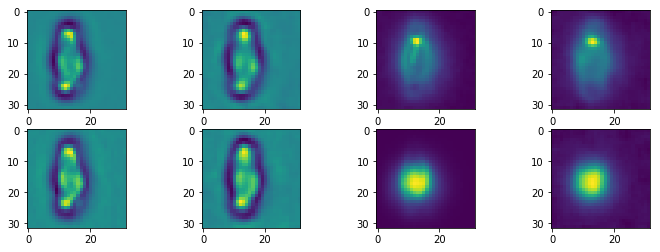

(4, 128, 64)
Epoch:  24 Iteration:  200 Loss:  162.27228
(32, 32, 4) (4, 32, 32, 1)


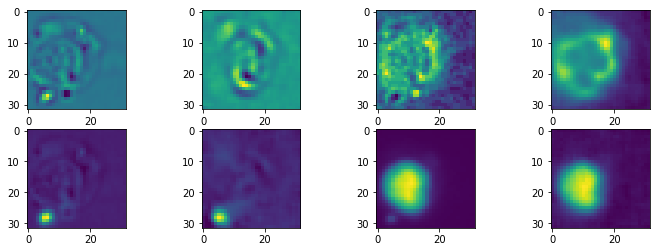

(4, 128, 64)
Epoch:  24 Iteration:  400 Loss:  148.66241
(32, 32, 4) (4, 32, 32, 1)


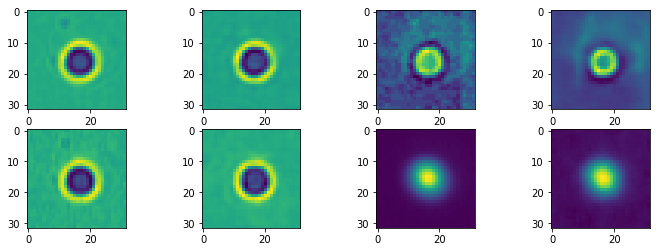

(4, 128, 64)
Epoch:  24 Iteration:  600 Loss:  162.10727
(32, 32, 4) (4, 32, 32, 1)


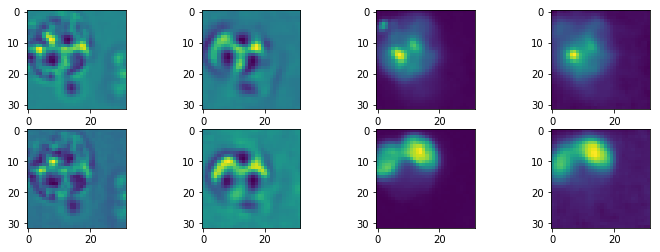

(4, 128, 64)
Epoch:  24 Iteration:  800 Loss:  182.91669
(32, 32, 4) (4, 32, 32, 1)


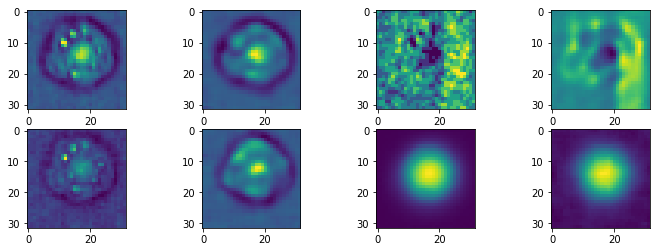

(4, 128, 64)
Epoch:  24 Iteration:  1000 Loss:  167.01645
(32, 32, 4) (4, 32, 32, 1)


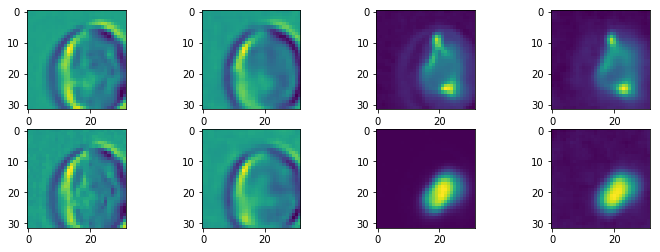

(4, 128, 64)
Epoch:  24 Iteration:  1200 Loss:  170.08517
(32, 32, 4) (4, 32, 32, 1)


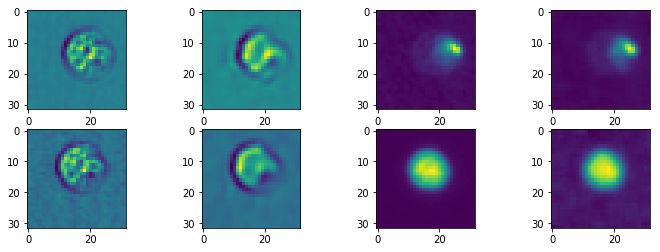

(4, 128, 64)
Epoch:  24 Iteration:  1400 Loss:  170.97658
(32, 32, 4) (4, 32, 32, 1)


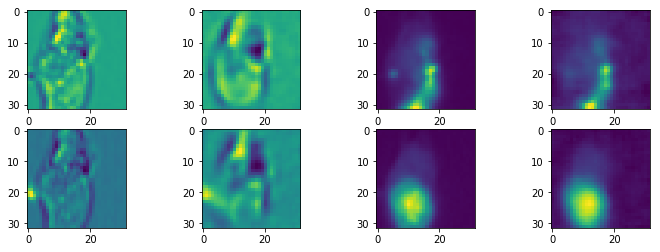

(4, 128, 64)
Epoch:  25 Iteration:  0 Loss:  176.13835
(32, 32, 4) (4, 32, 32, 1)


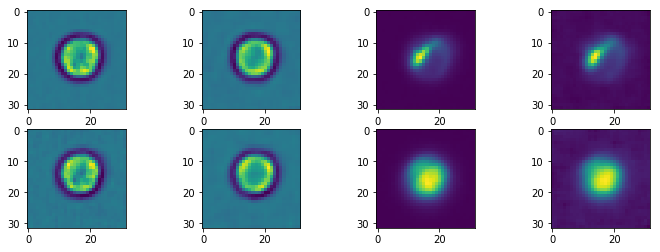

(4, 128, 64)
Epoch:  25 Iteration:  200 Loss:  160.16809
(32, 32, 4) (4, 32, 32, 1)


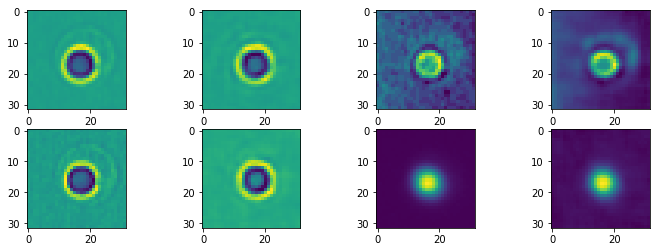

(4, 128, 64)
Epoch:  25 Iteration:  400 Loss:  146.84785
(32, 32, 4) (4, 32, 32, 1)


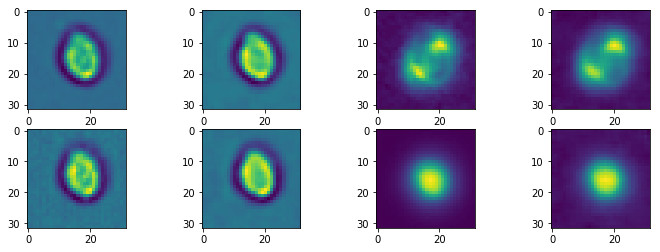

(4, 128, 64)
Epoch:  25 Iteration:  600 Loss:  160.97177
(32, 32, 4) (4, 32, 32, 1)


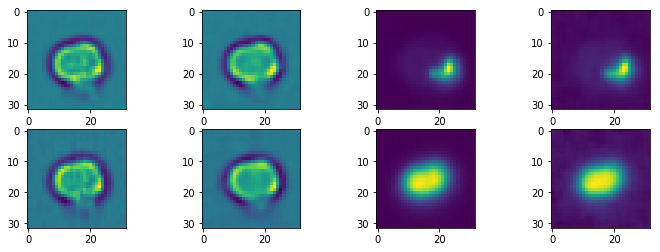

(4, 128, 64)
Epoch:  25 Iteration:  800 Loss:  183.71121
(32, 32, 4) (4, 32, 32, 1)


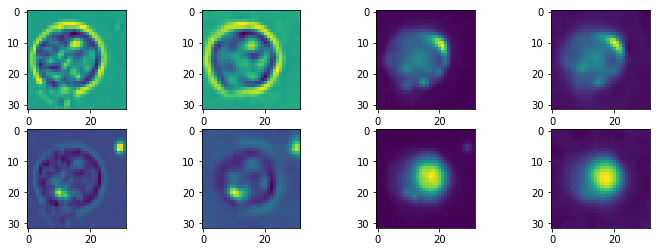

(4, 128, 64)
Epoch:  25 Iteration:  1000 Loss:  165.63531
(32, 32, 4) (4, 32, 32, 1)


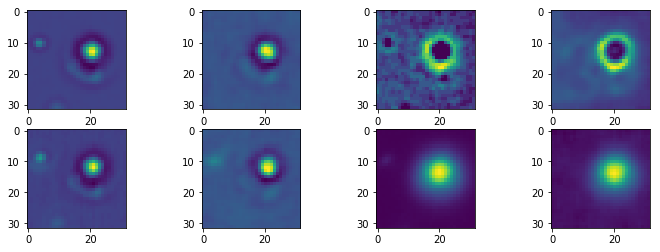

(4, 128, 64)
Epoch:  25 Iteration:  1200 Loss:  170.54489
(32, 32, 4) (4, 32, 32, 1)


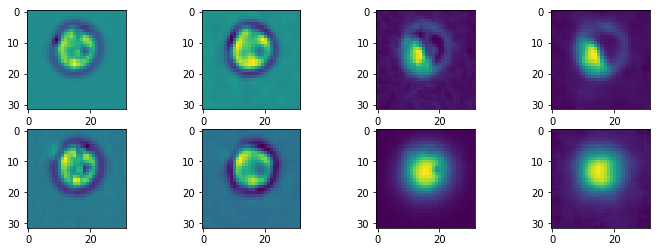

(4, 128, 64)
Epoch:  25 Iteration:  1400 Loss:  169.26317
(32, 32, 4) (4, 32, 32, 1)


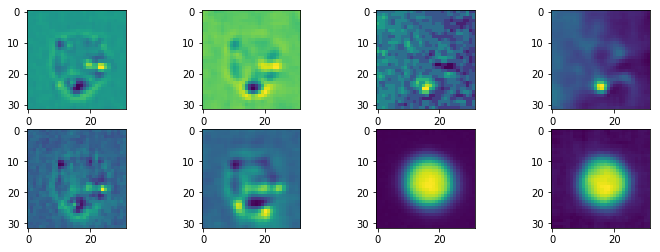

(4, 128, 64)
Epoch:  26 Iteration:  0 Loss:  172.82419
(32, 32, 4) (4, 32, 32, 1)


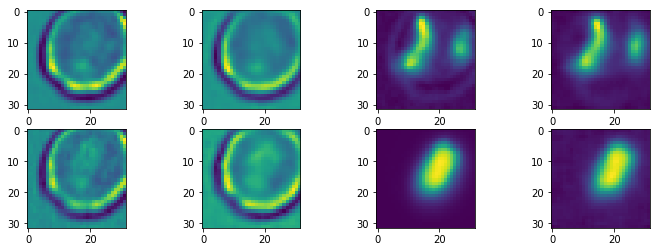

(4, 128, 64)
Epoch:  26 Iteration:  200 Loss:  157.70877
(32, 32, 4) (4, 32, 32, 1)


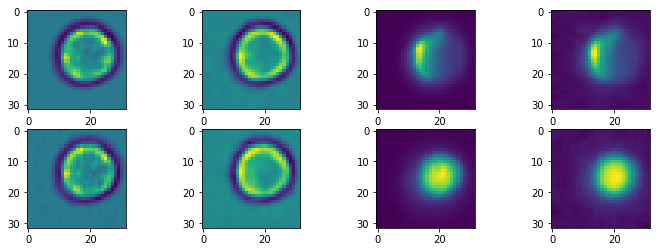

(4, 128, 64)
Epoch:  26 Iteration:  400 Loss:  145.54803
(32, 32, 4) (4, 32, 32, 1)


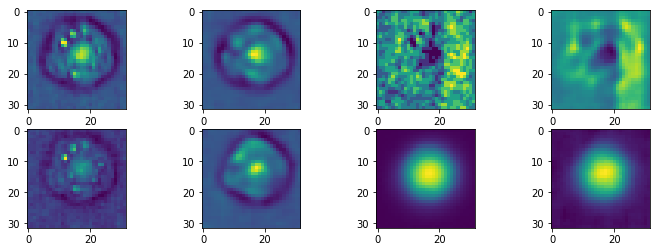

(4, 128, 64)
Epoch:  26 Iteration:  600 Loss:  160.29144
(32, 32, 4) (4, 32, 32, 1)


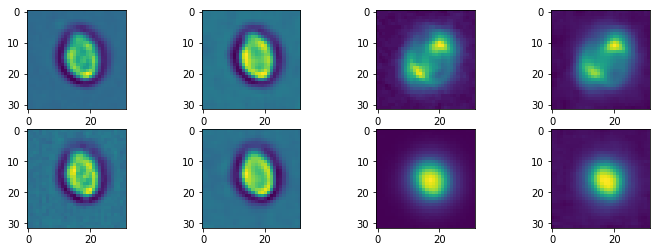

(4, 128, 64)
Epoch:  26 Iteration:  800 Loss:  180.13327
(32, 32, 4) (4, 32, 32, 1)


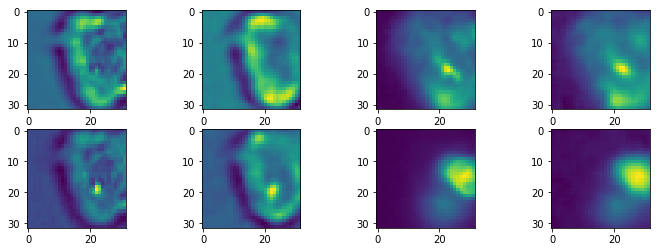

(4, 128, 64)
Epoch:  26 Iteration:  1000 Loss:  165.42279
(32, 32, 4) (4, 32, 32, 1)


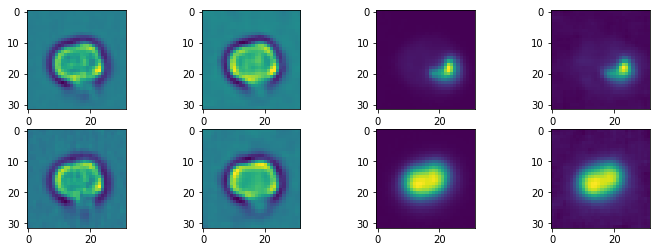

(4, 128, 64)
Epoch:  26 Iteration:  1200 Loss:  166.33453
(32, 32, 4) (4, 32, 32, 1)


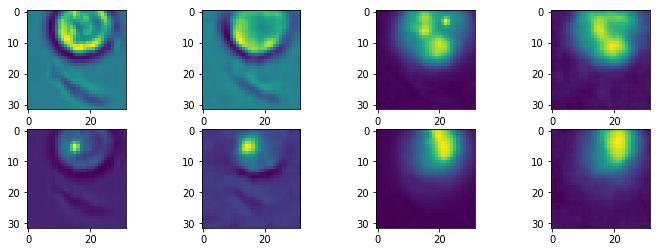

(4, 128, 64)
Epoch:  26 Iteration:  1400 Loss:  168.0274
(32, 32, 4) (4, 32, 32, 1)


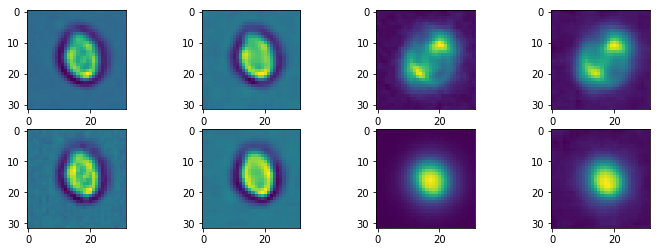

(4, 128, 64)
Epoch:  27 Iteration:  0 Loss:  170.736
(32, 32, 4) (4, 32, 32, 1)


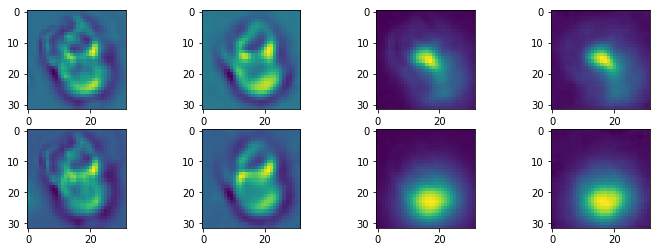

(4, 128, 64)
Epoch:  27 Iteration:  200 Loss:  156.63321
(32, 32, 4) (4, 32, 32, 1)


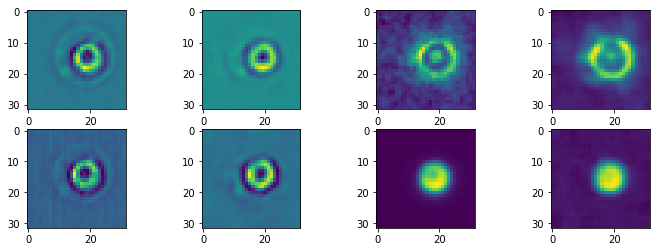

(4, 128, 64)
Epoch:  27 Iteration:  400 Loss:  143.33871
(32, 32, 4) (4, 32, 32, 1)


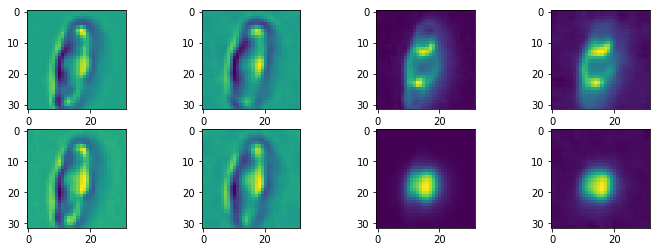

(4, 128, 64)
Epoch:  27 Iteration:  600 Loss:  160.67123
(32, 32, 4) (4, 32, 32, 1)


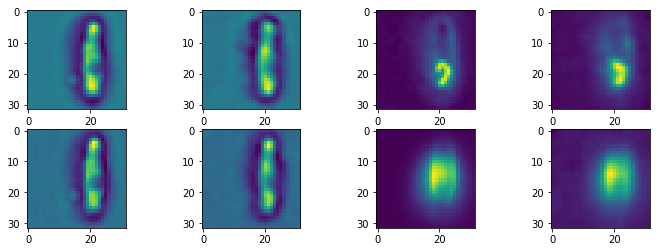

(4, 128, 64)
Epoch:  27 Iteration:  800 Loss:  180.39355
(32, 32, 4) (4, 32, 32, 1)


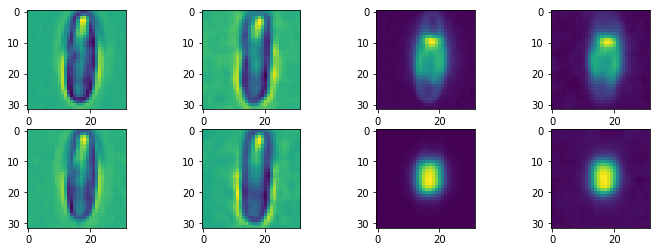

(4, 128, 64)
Epoch:  27 Iteration:  1000 Loss:  163.3704
(32, 32, 4) (4, 32, 32, 1)


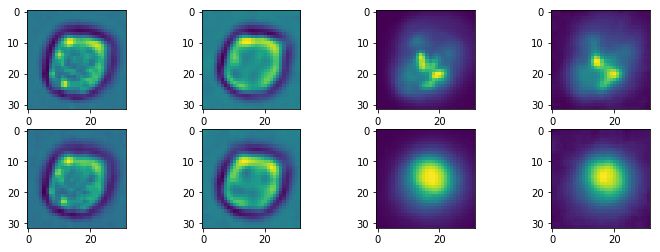

(4, 128, 64)
Epoch:  27 Iteration:  1200 Loss:  167.80643
(32, 32, 4) (4, 32, 32, 1)


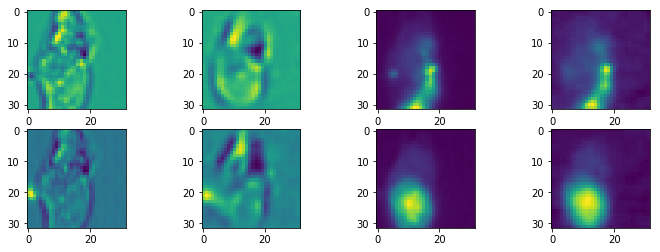

(4, 128, 64)
Epoch:  27 Iteration:  1400 Loss:  166.73595
(32, 32, 4) (4, 32, 32, 1)


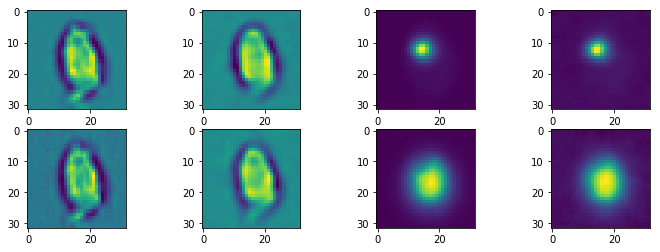

(4, 128, 64)
Epoch:  28 Iteration:  0 Loss:  171.80237
(32, 32, 4) (4, 32, 32, 1)


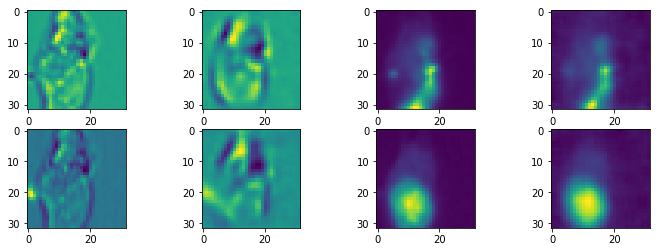

(4, 128, 64)
Epoch:  28 Iteration:  200 Loss:  155.16077
(32, 32, 4) (4, 32, 32, 1)


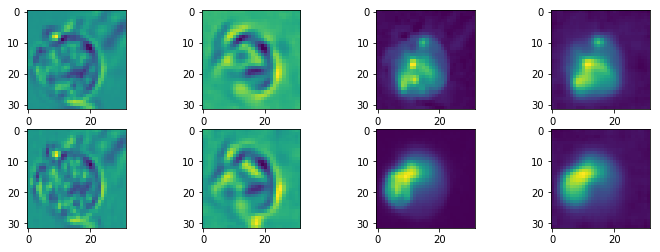

(4, 128, 64)
Epoch:  28 Iteration:  400 Loss:  143.13031
(32, 32, 4) (4, 32, 32, 1)


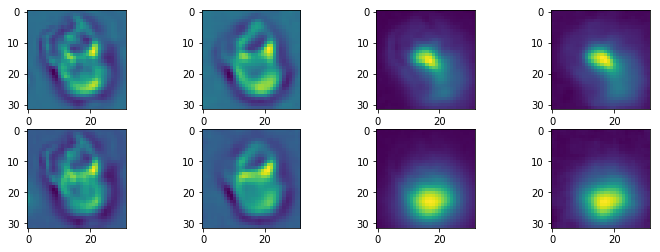

(4, 128, 64)
Epoch:  28 Iteration:  600 Loss:  156.09319
(32, 32, 4) (4, 32, 32, 1)


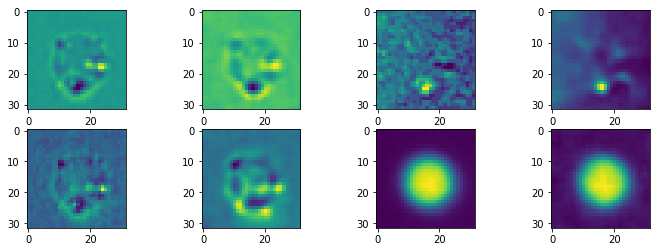

(4, 128, 64)
Epoch:  28 Iteration:  800 Loss:  178.1541
(32, 32, 4) (4, 32, 32, 1)


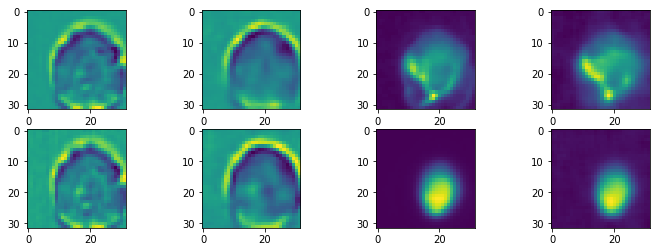

(4, 128, 64)
Epoch:  28 Iteration:  1000 Loss:  163.32921
(32, 32, 4) (4, 32, 32, 1)


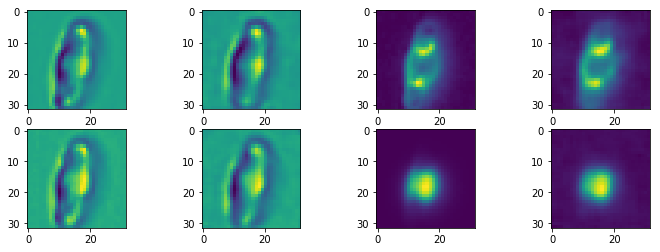

(4, 128, 64)
Epoch:  28 Iteration:  1200 Loss:  165.06584
(32, 32, 4) (4, 32, 32, 1)


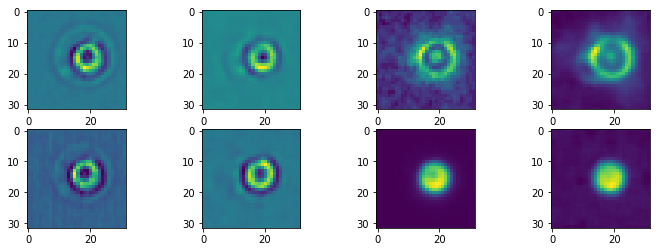

(4, 128, 64)
Epoch:  28 Iteration:  1400 Loss:  165.92831
(32, 32, 4) (4, 32, 32, 1)


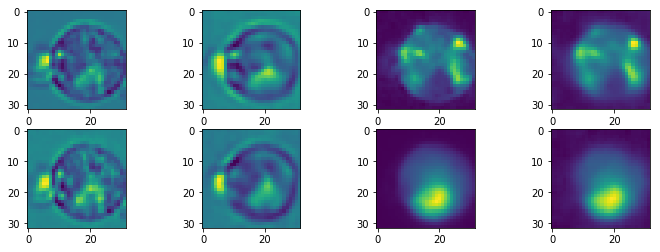

(4, 128, 64)
Epoch:  29 Iteration:  0 Loss:  169.99666
(32, 32, 4) (4, 32, 32, 1)


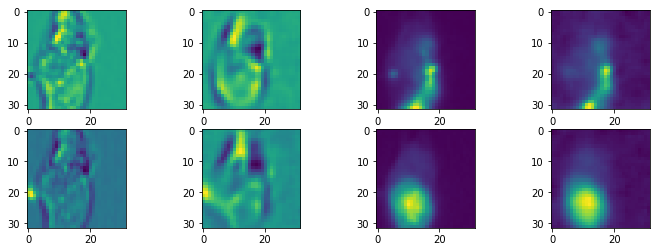

(4, 128, 64)
Epoch:  29 Iteration:  200 Loss:  154.5401
(32, 32, 4) (4, 32, 32, 1)


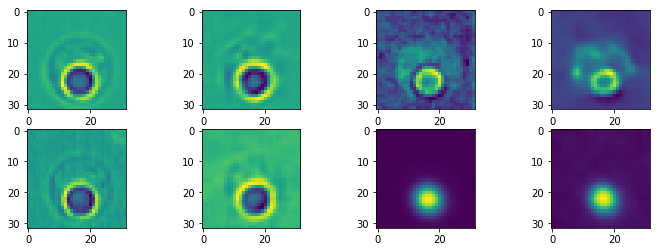

(4, 128, 64)
Epoch:  29 Iteration:  400 Loss:  142.7829
(32, 32, 4) (4, 32, 32, 1)


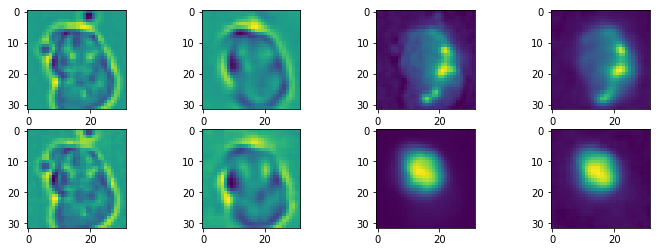

(4, 128, 64)
Epoch:  29 Iteration:  600 Loss:  155.6214
(32, 32, 4) (4, 32, 32, 1)


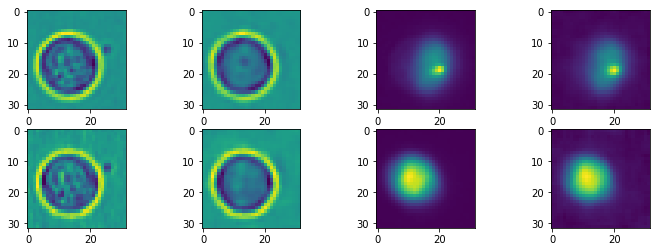

(4, 128, 64)
Epoch:  29 Iteration:  800 Loss:  177.65762
(32, 32, 4) (4, 32, 32, 1)


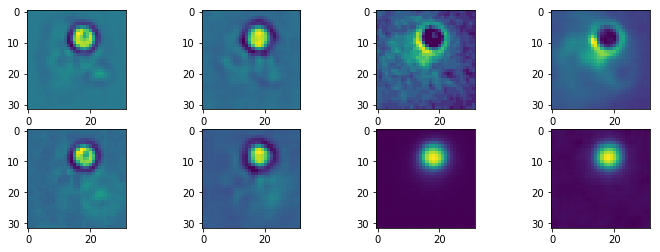

(4, 128, 64)
Epoch:  29 Iteration:  1000 Loss:  161.44046
(32, 32, 4) (4, 32, 32, 1)


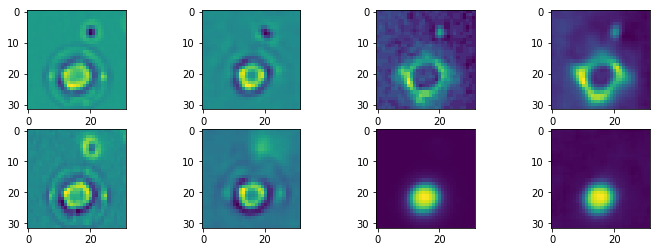

(4, 128, 64)
Epoch:  29 Iteration:  1200 Loss:  163.81729
(32, 32, 4) (4, 32, 32, 1)


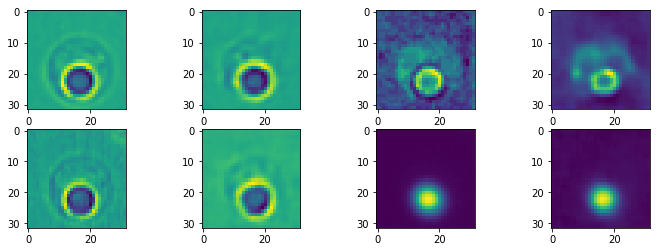

(4, 128, 64)
Epoch:  29 Iteration:  1400 Loss:  163.3154
(32, 32, 4) (4, 32, 32, 1)


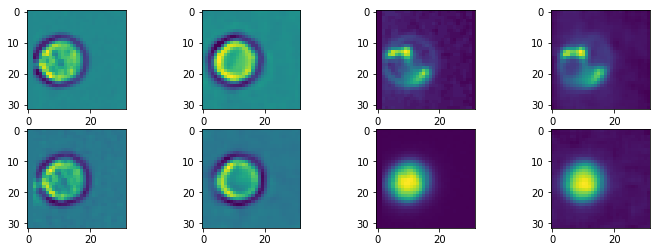

(4, 128, 64)
Epoch:  30 Iteration:  0 Loss:  170.07767
(32, 32, 4) (4, 32, 32, 1)


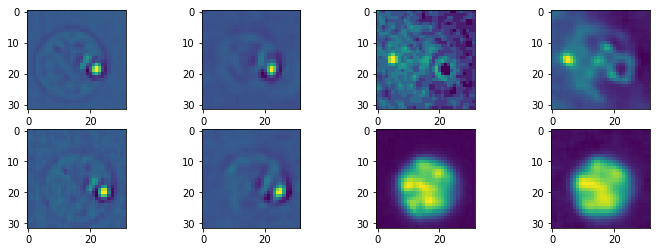

(4, 128, 64)
Epoch:  30 Iteration:  200 Loss:  154.49811
(32, 32, 4) (4, 32, 32, 1)


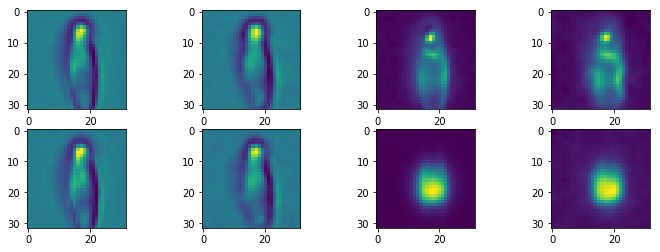

(4, 128, 64)
Epoch:  30 Iteration:  400 Loss:  140.92677
(32, 32, 4) (4, 32, 32, 1)


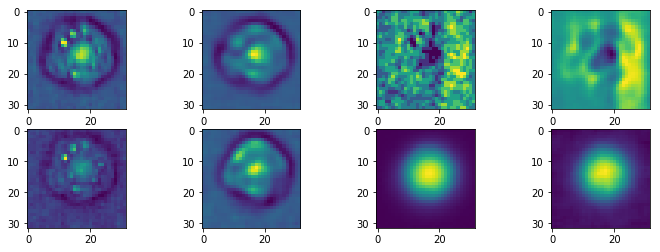

(4, 128, 64)
Epoch:  30 Iteration:  600 Loss:  156.71988
(32, 32, 4) (4, 32, 32, 1)


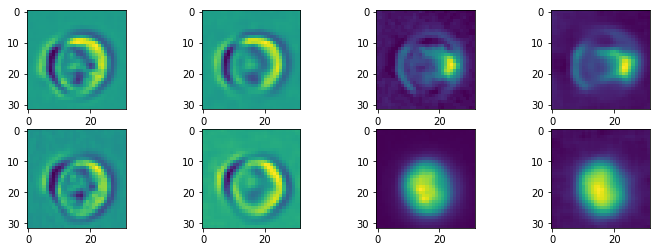

(4, 128, 64)
Epoch:  30 Iteration:  800 Loss:  177.49783
(32, 32, 4) (4, 32, 32, 1)


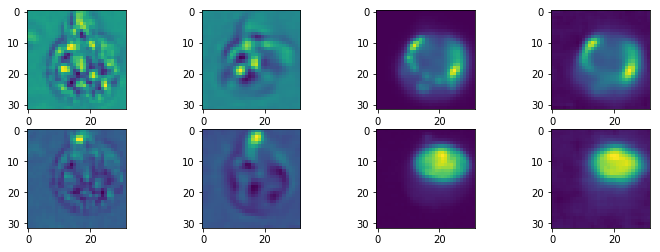

(4, 128, 64)
Epoch:  30 Iteration:  1000 Loss:  161.387
(32, 32, 4) (4, 32, 32, 1)


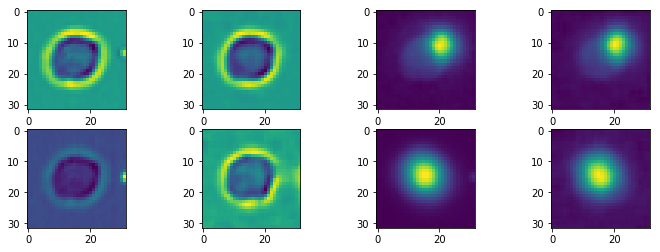

(4, 128, 64)
Epoch:  30 Iteration:  1200 Loss:  161.44514
(32, 32, 4) (4, 32, 32, 1)


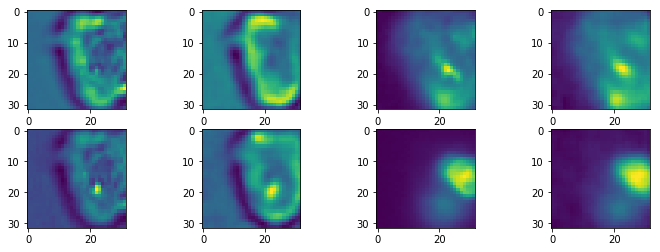

(4, 128, 64)
Epoch:  30 Iteration:  1400 Loss:  162.80829
(32, 32, 4) (4, 32, 32, 1)


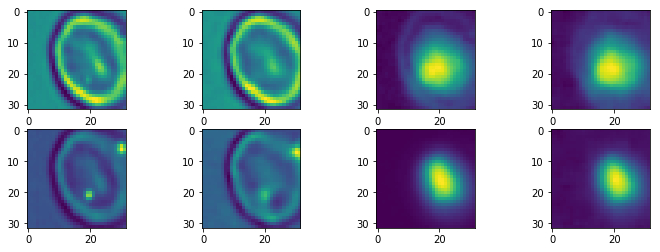

(4, 128, 64)
Epoch:  31 Iteration:  0 Loss:  166.9589
(32, 32, 4) (4, 32, 32, 1)


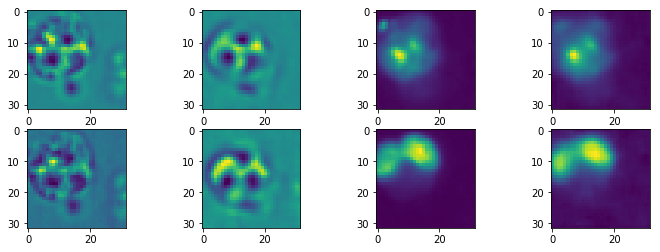

(4, 128, 64)
Epoch:  31 Iteration:  200 Loss:  152.5127
(32, 32, 4) (4, 32, 32, 1)


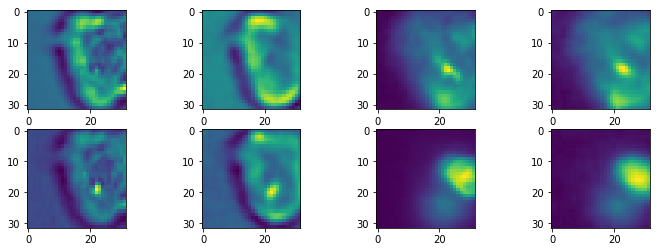

(4, 128, 64)
Epoch:  31 Iteration:  400 Loss:  139.97333
(32, 32, 4) (4, 32, 32, 1)


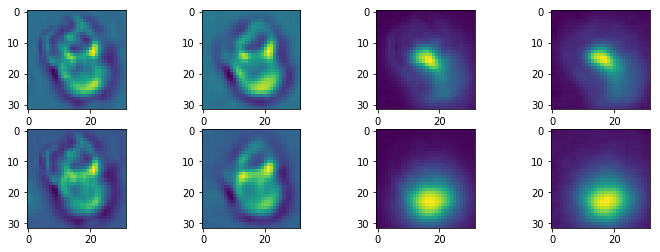

(4, 128, 64)
Epoch:  31 Iteration:  600 Loss:  154.73683
(32, 32, 4) (4, 32, 32, 1)


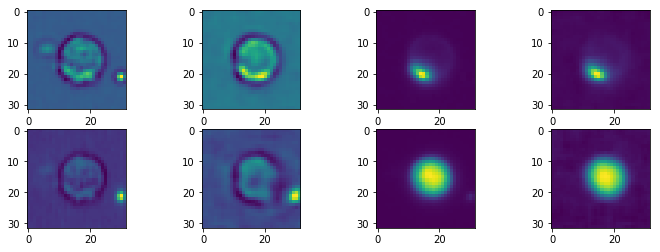

(4, 128, 64)
Epoch:  31 Iteration:  800 Loss:  175.09964
(32, 32, 4) (4, 32, 32, 1)


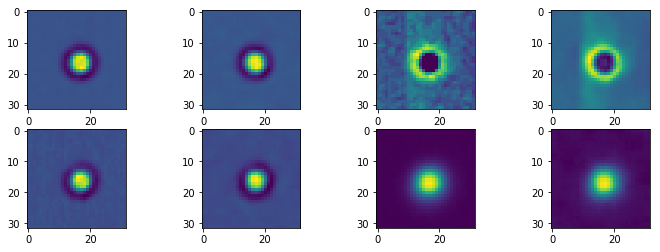

(4, 128, 64)
Epoch:  31 Iteration:  1000 Loss:  160.3359
(32, 32, 4) (4, 32, 32, 1)


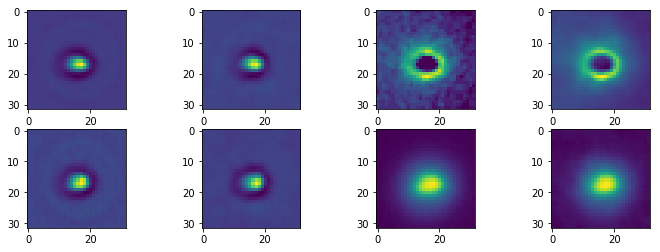

(4, 128, 64)
Epoch:  31 Iteration:  1200 Loss:  162.56323
(32, 32, 4) (4, 32, 32, 1)


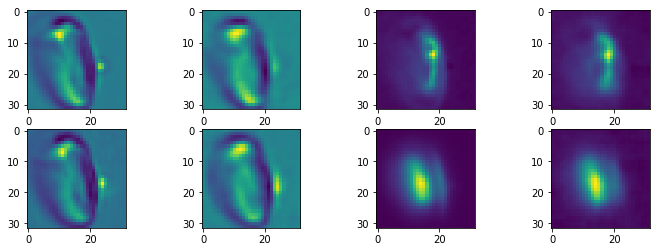

(4, 128, 64)
Epoch:  31 Iteration:  1400 Loss:  162.58453
(32, 32, 4) (4, 32, 32, 1)


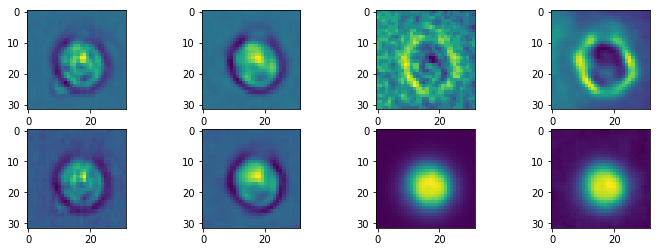

(4, 128, 64)
Epoch:  32 Iteration:  0 Loss:  166.38869
(32, 32, 4) (4, 32, 32, 1)


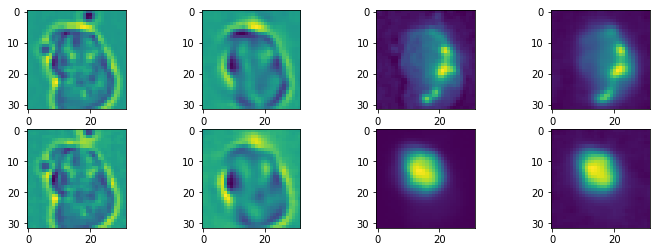

(4, 128, 64)
Epoch:  32 Iteration:  200 Loss:  152.67548
(32, 32, 4) (4, 32, 32, 1)


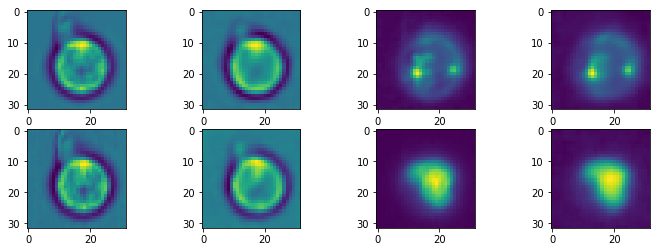

(4, 128, 64)
Epoch:  32 Iteration:  400 Loss:  139.21982
(32, 32, 4) (4, 32, 32, 1)


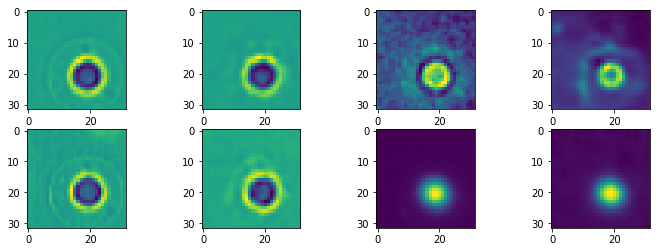

(4, 128, 64)
Epoch:  32 Iteration:  600 Loss:  154.15347
(32, 32, 4) (4, 32, 32, 1)


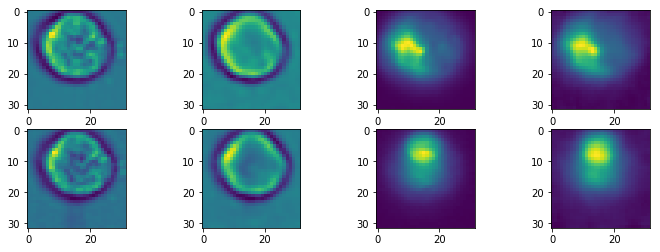

(4, 128, 64)
Epoch:  32 Iteration:  800 Loss:  173.87521
(32, 32, 4) (4, 32, 32, 1)


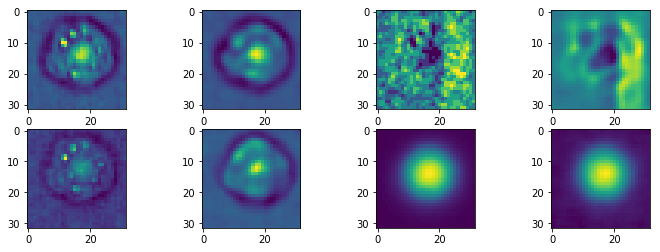

(4, 128, 64)
Epoch:  32 Iteration:  1000 Loss:  158.49118
(32, 32, 4) (4, 32, 32, 1)


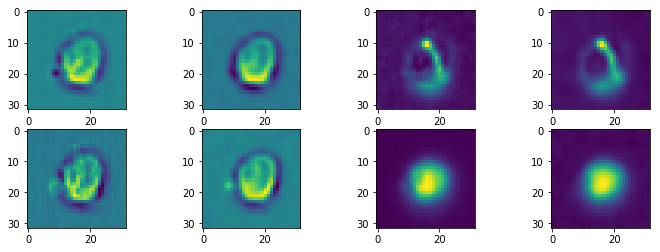

(4, 128, 64)
Epoch:  32 Iteration:  1200 Loss:  162.04599
(32, 32, 4) (4, 32, 32, 1)


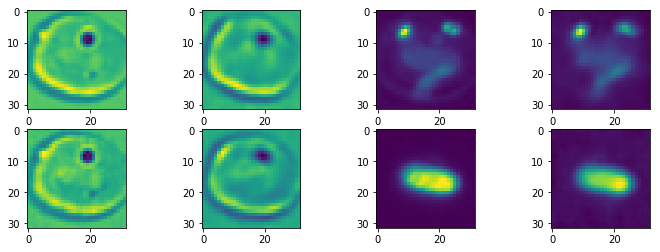

(4, 128, 64)
Epoch:  32 Iteration:  1400 Loss:  160.59589
(32, 32, 4) (4, 32, 32, 1)


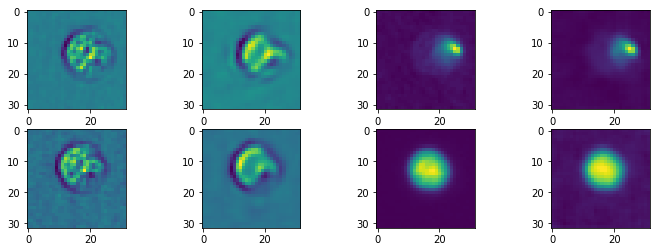

(4, 128, 64)
Epoch:  33 Iteration:  0 Loss:  167.9722
(32, 32, 4) (4, 32, 32, 1)


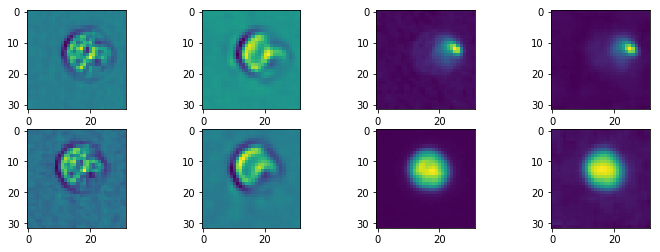

(4, 128, 64)
Epoch:  33 Iteration:  200 Loss:  150.20348
(32, 32, 4) (4, 32, 32, 1)


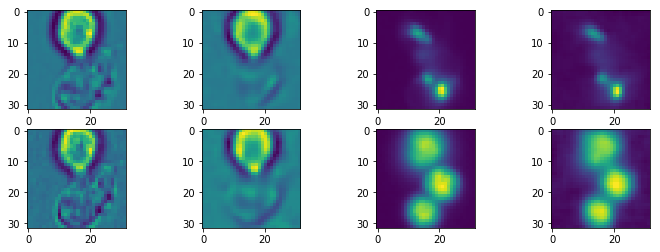

(4, 128, 64)
Epoch:  33 Iteration:  400 Loss:  138.08832
(32, 32, 4) (4, 32, 32, 1)


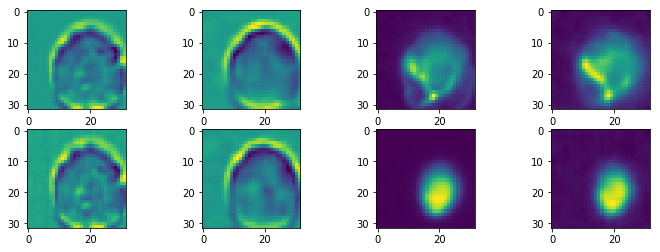

(4, 128, 64)
Epoch:  33 Iteration:  600 Loss:  151.79419
(32, 32, 4) (4, 32, 32, 1)


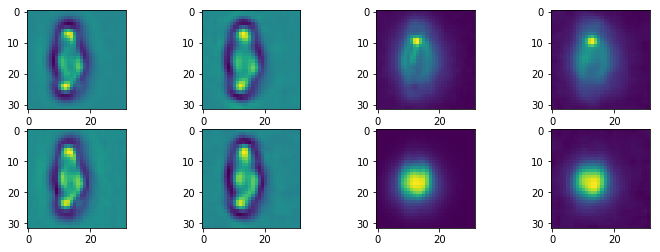

(4, 128, 64)
Epoch:  33 Iteration:  800 Loss:  171.79747
(32, 32, 4) (4, 32, 32, 1)


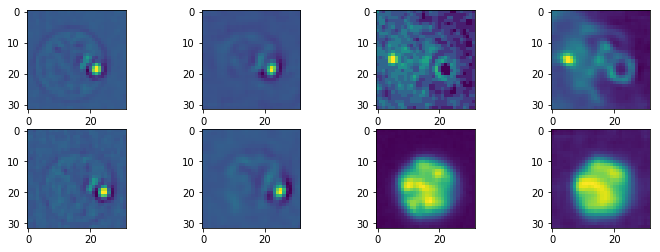

(4, 128, 64)
Epoch:  33 Iteration:  1000 Loss:  158.28558
(32, 32, 4) (4, 32, 32, 1)


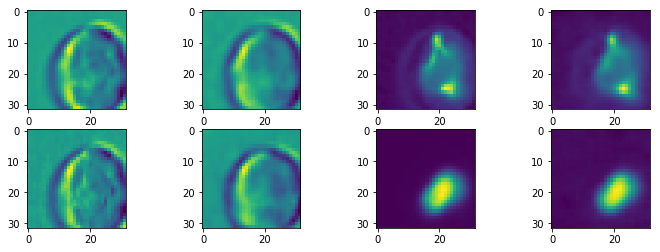

(4, 128, 64)
Epoch:  33 Iteration:  1200 Loss:  159.69984
(32, 32, 4) (4, 32, 32, 1)


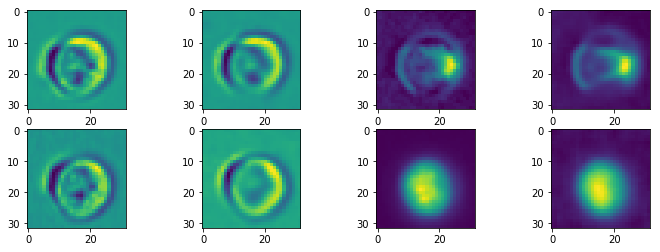

(4, 128, 64)
Epoch:  33 Iteration:  1400 Loss:  159.77594
(32, 32, 4) (4, 32, 32, 1)


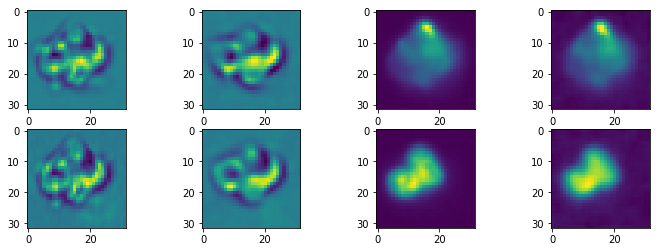

(4, 128, 64)
Epoch:  34 Iteration:  0 Loss:  164.89896
(32, 32, 4) (4, 32, 32, 1)


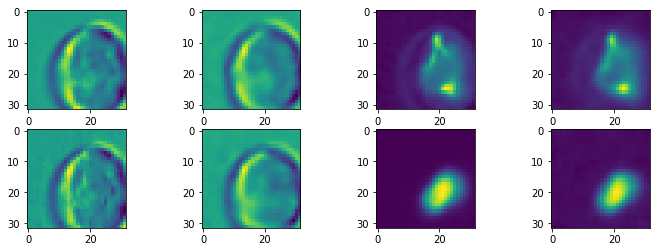

(4, 128, 64)
Epoch:  34 Iteration:  200 Loss:  148.99931
(32, 32, 4) (4, 32, 32, 1)


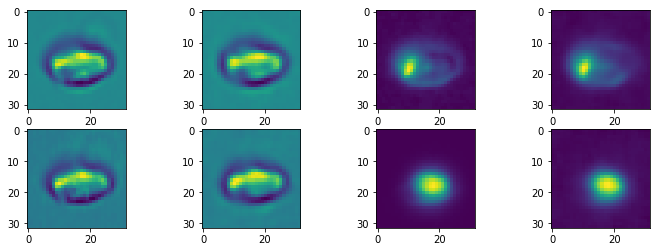

(4, 128, 64)
Epoch:  34 Iteration:  400 Loss:  136.89484
(32, 32, 4) (4, 32, 32, 1)


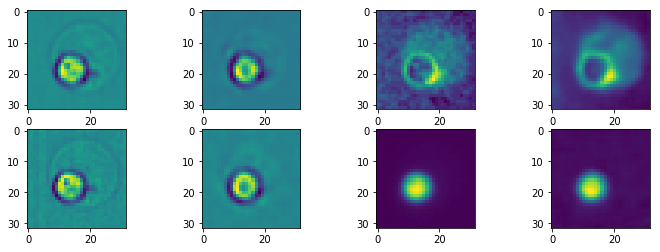

(4, 128, 64)
Epoch:  34 Iteration:  600 Loss:  152.05386
(32, 32, 4) (4, 32, 32, 1)


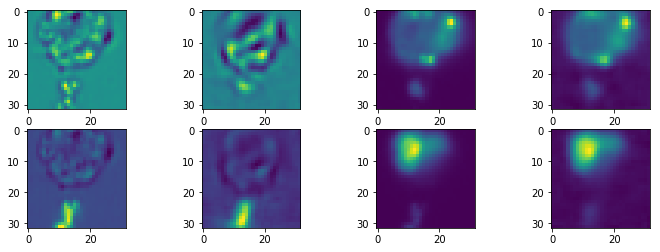

(4, 128, 64)
Epoch:  34 Iteration:  800 Loss:  174.19168
(32, 32, 4) (4, 32, 32, 1)


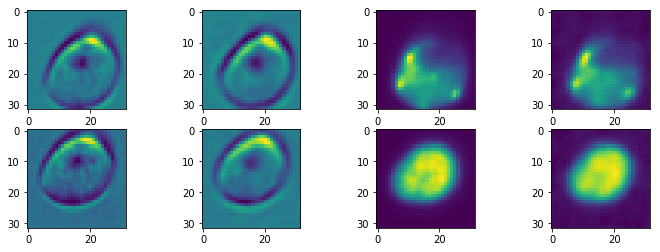

(4, 128, 64)
Epoch:  34 Iteration:  1000 Loss:  158.1979
(32, 32, 4) (4, 32, 32, 1)


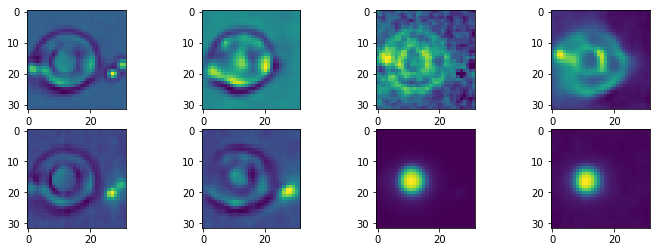

(4, 128, 64)
Epoch:  34 Iteration:  1200 Loss:  159.36331
(32, 32, 4) (4, 32, 32, 1)


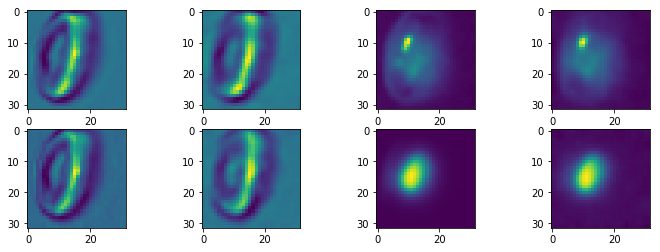

(4, 128, 64)
Epoch:  34 Iteration:  1400 Loss:  159.99077
(32, 32, 4) (4, 32, 32, 1)


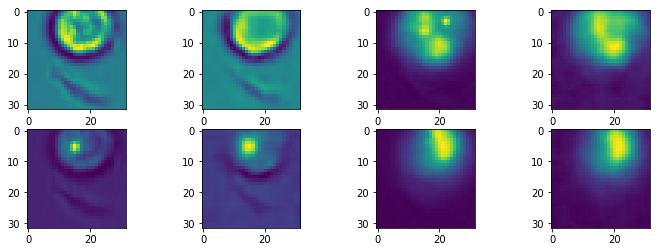

(4, 128, 64)
Epoch:  35 Iteration:  0 Loss:  162.949
(32, 32, 4) (4, 32, 32, 1)


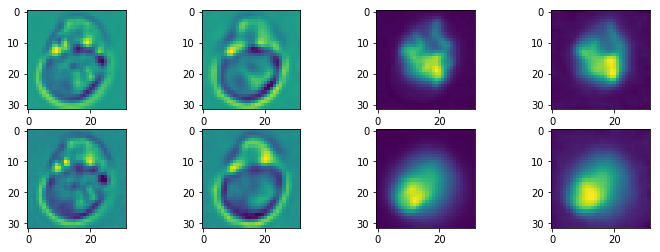

(4, 128, 64)
Epoch:  35 Iteration:  200 Loss:  149.9353
(32, 32, 4) (4, 32, 32, 1)


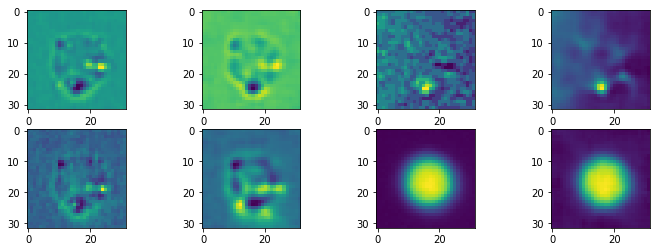

(4, 128, 64)
Epoch:  35 Iteration:  400 Loss:  136.71927
(32, 32, 4) (4, 32, 32, 1)


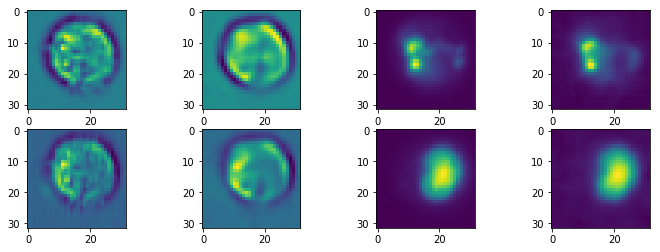

(4, 128, 64)
Epoch:  35 Iteration:  600 Loss:  149.62817
(32, 32, 4) (4, 32, 32, 1)


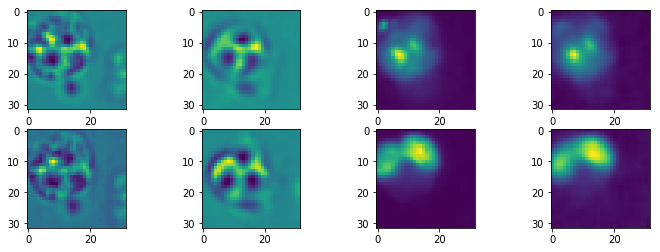

(4, 128, 64)
Epoch:  35 Iteration:  800 Loss:  172.34097
(32, 32, 4) (4, 32, 32, 1)


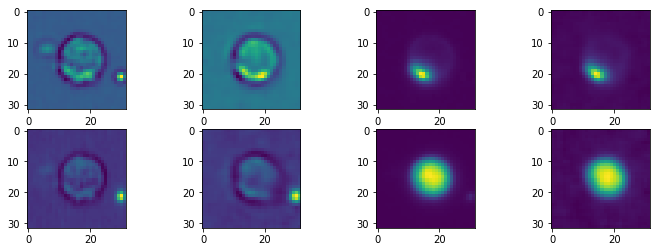

(4, 128, 64)
Epoch:  35 Iteration:  1000 Loss:  156.70236
(32, 32, 4) (4, 32, 32, 1)


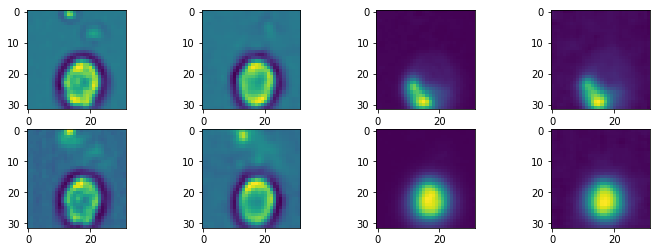

(4, 128, 64)
Epoch:  35 Iteration:  1200 Loss:  158.83377
(32, 32, 4) (4, 32, 32, 1)


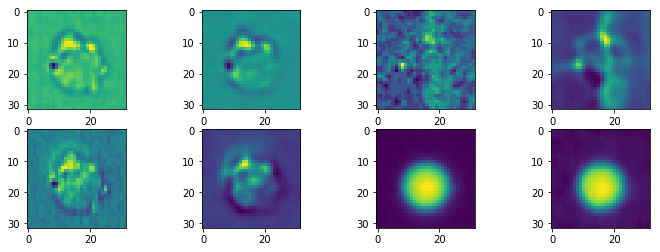

(4, 128, 64)
Epoch:  35 Iteration:  1400 Loss:  160.03415
(32, 32, 4) (4, 32, 32, 1)


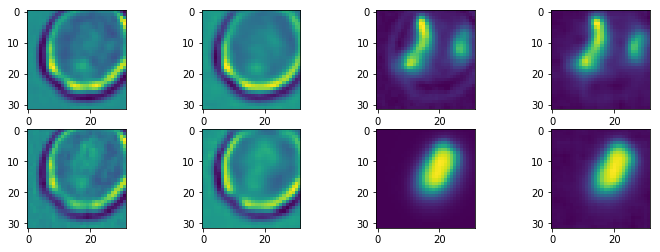

(4, 128, 64)
Epoch:  36 Iteration:  0 Loss:  161.70596
(32, 32, 4) (4, 32, 32, 1)


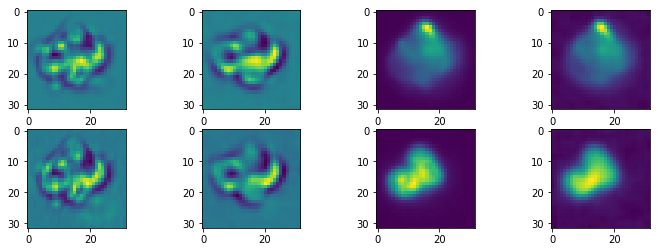

(4, 128, 64)
Epoch:  36 Iteration:  200 Loss:  147.90694
(32, 32, 4) (4, 32, 32, 1)


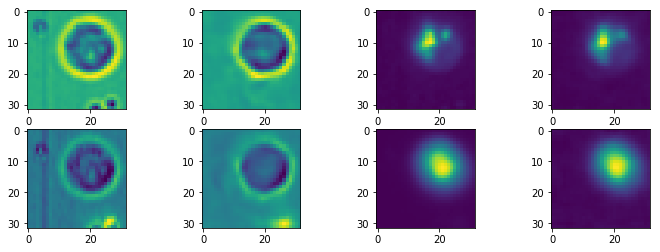

(4, 128, 64)
Epoch:  36 Iteration:  400 Loss:  133.81168
(32, 32, 4) (4, 32, 32, 1)


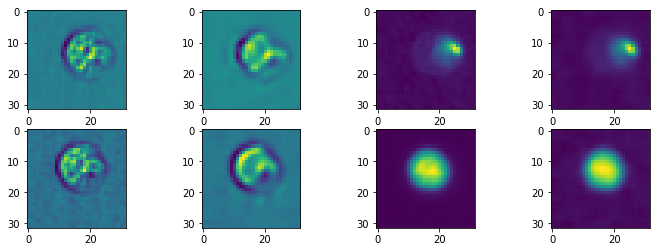

(4, 128, 64)
Epoch:  36 Iteration:  600 Loss:  150.66803
(32, 32, 4) (4, 32, 32, 1)


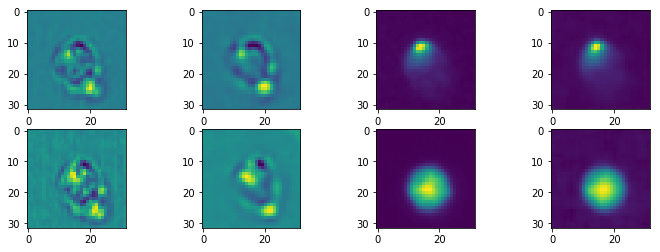

(4, 128, 64)
Epoch:  36 Iteration:  800 Loss:  174.84674
(32, 32, 4) (4, 32, 32, 1)


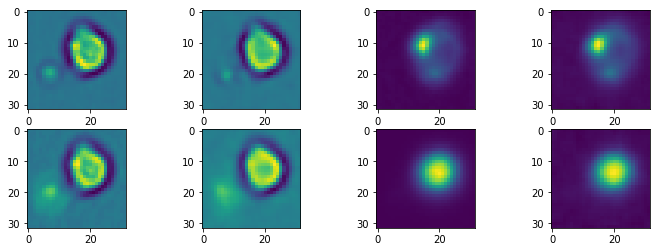

(4, 128, 64)
Epoch:  36 Iteration:  1000 Loss:  154.73145
(32, 32, 4) (4, 32, 32, 1)


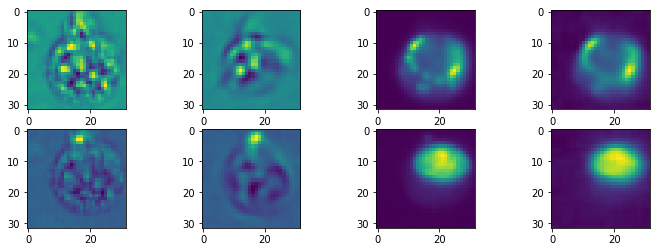

(4, 128, 64)
Epoch:  36 Iteration:  1200 Loss:  157.40297
(32, 32, 4) (4, 32, 32, 1)


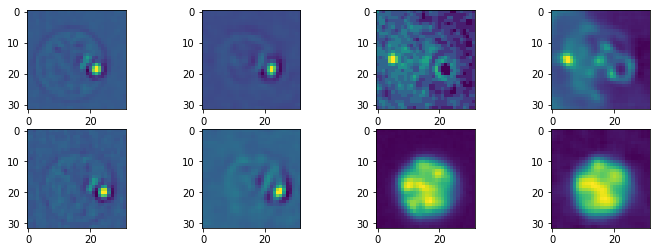

(4, 128, 64)
Epoch:  36 Iteration:  1400 Loss:  158.53253
(32, 32, 4) (4, 32, 32, 1)


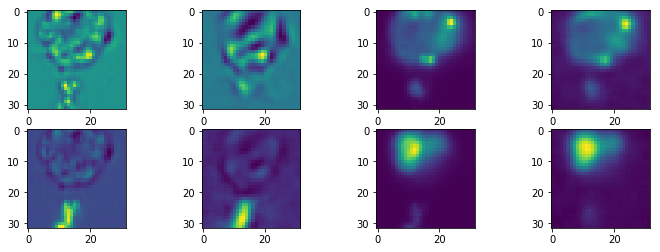

(4, 128, 64)
Epoch:  37 Iteration:  0 Loss:  164.74098
(32, 32, 4) (4, 32, 32, 1)


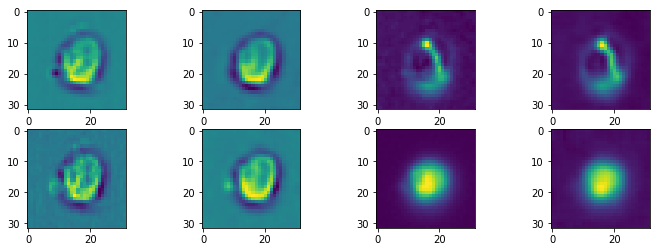

(4, 128, 64)
Epoch:  37 Iteration:  200 Loss:  149.20442
(32, 32, 4) (4, 32, 32, 1)


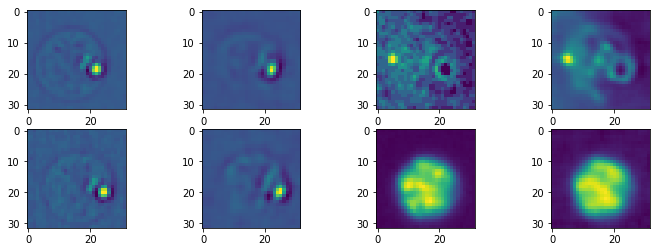

(4, 128, 64)
Epoch:  37 Iteration:  400 Loss:  135.14442
(32, 32, 4) (4, 32, 32, 1)


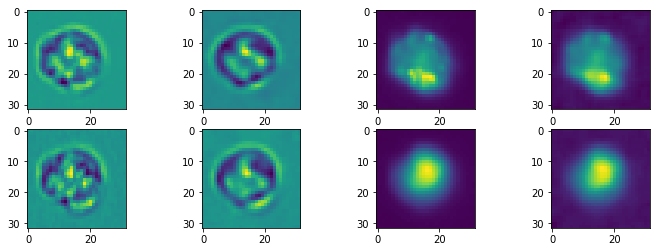

(4, 128, 64)
Epoch:  37 Iteration:  600 Loss:  150.33942
(32, 32, 4) (4, 32, 32, 1)


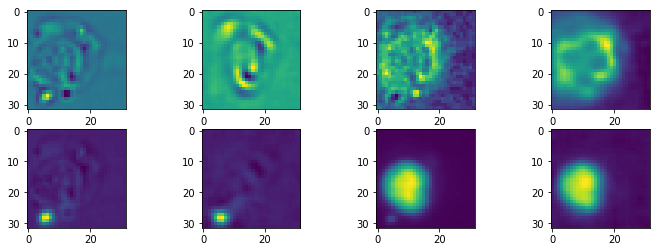

(4, 128, 64)
Epoch:  37 Iteration:  800 Loss:  170.05212
(32, 32, 4) (4, 32, 32, 1)


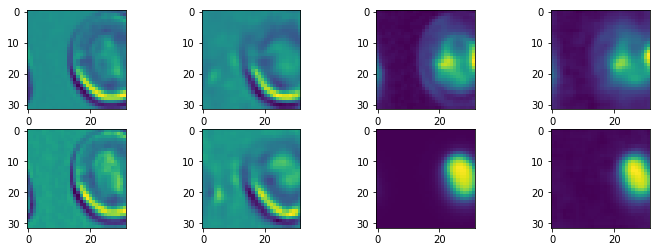

(4, 128, 64)
Epoch:  37 Iteration:  1000 Loss:  155.62025
(32, 32, 4) (4, 32, 32, 1)


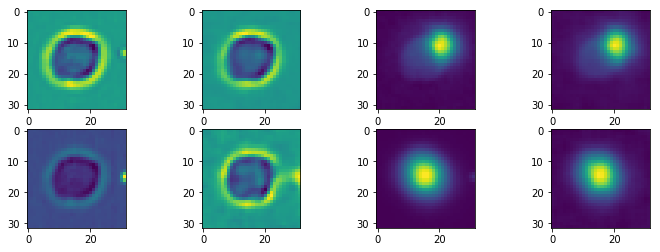

(4, 128, 64)
Epoch:  37 Iteration:  1200 Loss:  158.66803
(32, 32, 4) (4, 32, 32, 1)


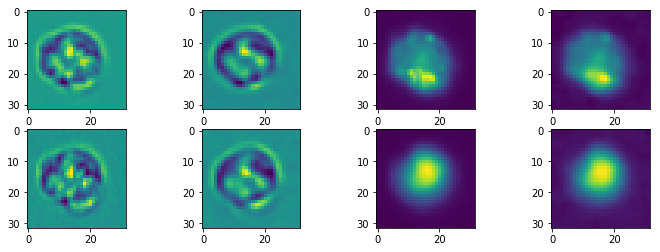

(4, 128, 64)
Epoch:  37 Iteration:  1400 Loss:  157.0284
(32, 32, 4) (4, 32, 32, 1)


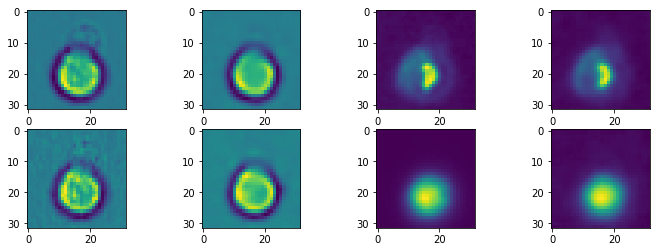

(4, 128, 64)
Epoch:  38 Iteration:  0 Loss:  161.54533
(32, 32, 4) (4, 32, 32, 1)


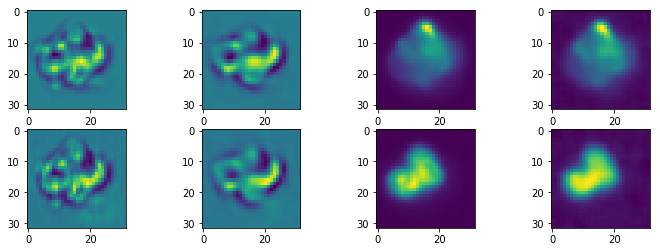

(4, 128, 64)
Epoch:  38 Iteration:  200 Loss:  147.06616
(32, 32, 4) (4, 32, 32, 1)


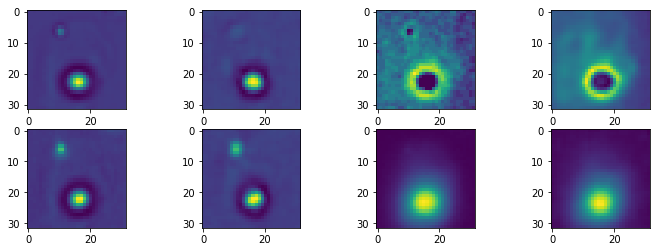

(4, 128, 64)
Epoch:  38 Iteration:  400 Loss:  133.77371
(32, 32, 4) (4, 32, 32, 1)


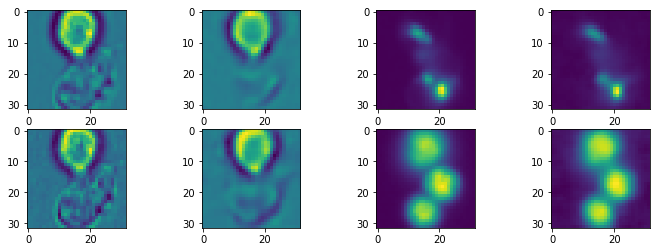

(4, 128, 64)
Epoch:  38 Iteration:  600 Loss:  148.7745
(32, 32, 4) (4, 32, 32, 1)


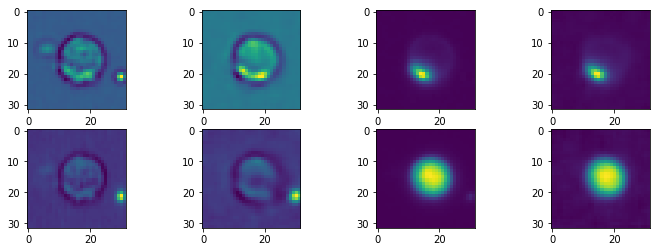

(4, 128, 64)
Epoch:  38 Iteration:  800 Loss:  169.81201
(32, 32, 4) (4, 32, 32, 1)


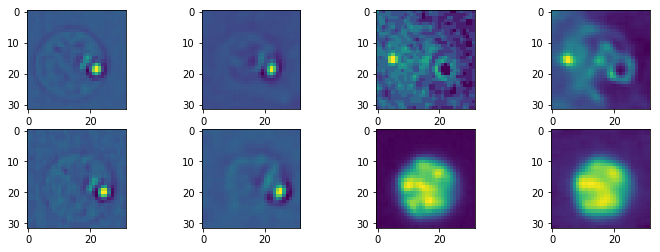

(4, 128, 64)
Epoch:  38 Iteration:  1000 Loss:  152.07166
(32, 32, 4) (4, 32, 32, 1)


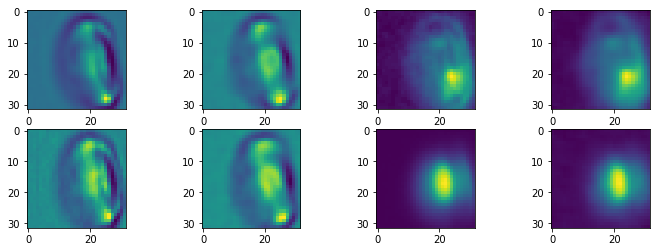

(4, 128, 64)
Epoch:  38 Iteration:  1200 Loss:  155.82304
(32, 32, 4) (4, 32, 32, 1)


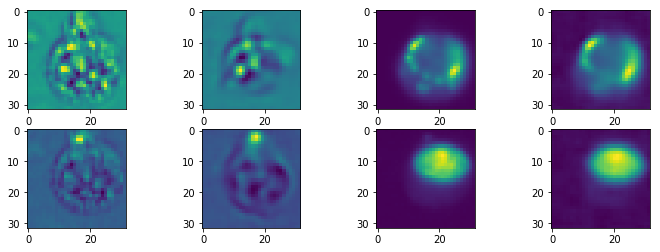

(4, 128, 64)
Epoch:  38 Iteration:  1400 Loss:  155.76215
(32, 32, 4) (4, 32, 32, 1)


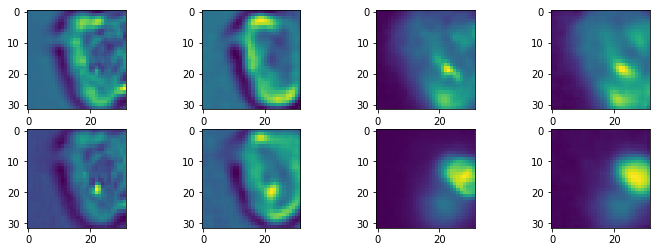

(4, 128, 64)
Epoch:  39 Iteration:  0 Loss:  161.43375
(32, 32, 4) (4, 32, 32, 1)


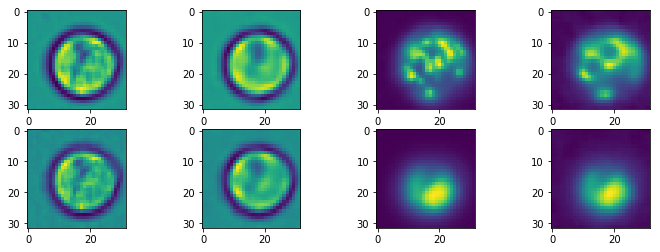

(4, 128, 64)
Epoch:  39 Iteration:  200 Loss:  146.9504
(32, 32, 4) (4, 32, 32, 1)


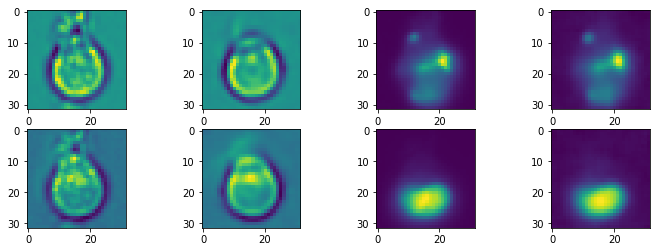

(4, 128, 64)
Epoch:  39 Iteration:  400 Loss:  133.51468
(32, 32, 4) (4, 32, 32, 1)


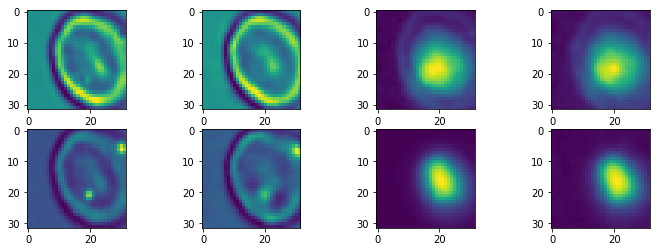

(4, 128, 64)
Epoch:  39 Iteration:  600 Loss:  147.69534
(32, 32, 4) (4, 32, 32, 1)


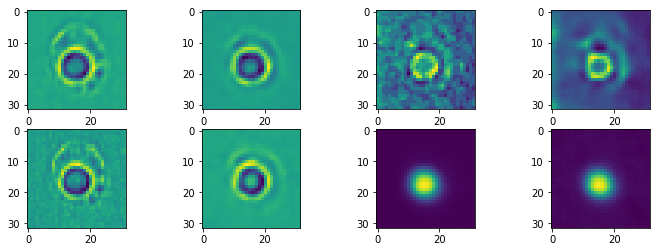

(4, 128, 64)
Epoch:  39 Iteration:  800 Loss:  167.84515
(32, 32, 4) (4, 32, 32, 1)


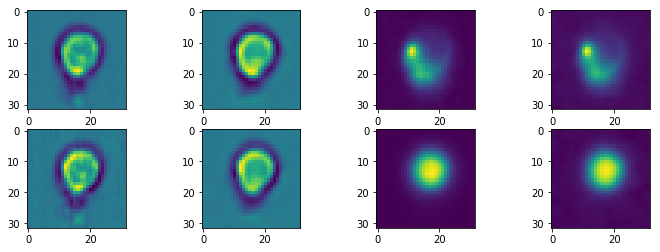

(4, 128, 64)
Epoch:  39 Iteration:  1000 Loss:  153.53574
(32, 32, 4) (4, 32, 32, 1)


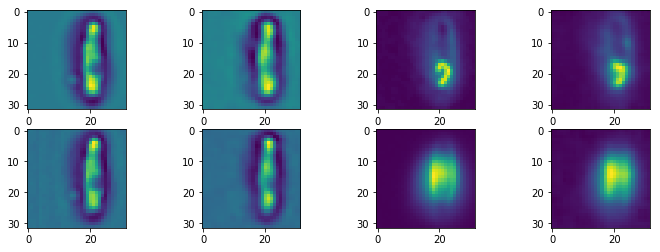

(4, 128, 64)
Epoch:  39 Iteration:  1200 Loss:  157.00562
(32, 32, 4) (4, 32, 32, 1)


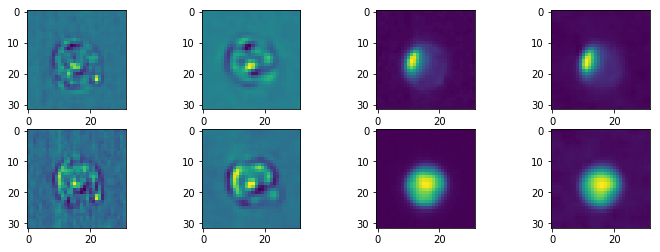

(4, 128, 64)
Epoch:  39 Iteration:  1400 Loss:  155.90591
(32, 32, 4) (4, 32, 32, 1)


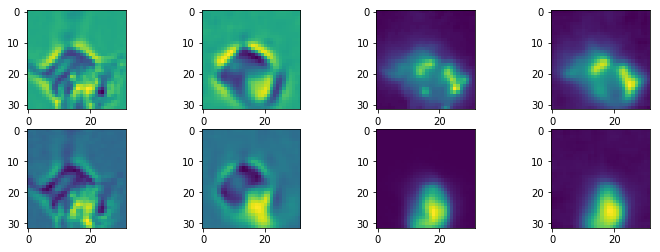

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 40
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 64 #128 + 64
p_droprate = 0.95
p_stdev = .04
p_slam = .00005
p_denoise = None
enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev
params['slam'] = p_slam
params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes
params['denoise'] = p_denoise
cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-05-31-Sparse_Channel_1_128"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_channels.train(p_mmdict, p_df, params, 200, cpdir)

In [ ]:
x = 4
x